# Modelo Regresion Lineal

## Importacion de las paqueterias 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import cross_validate

from sklearn.linear_model import LinearRegression

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error 

from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

import pickle
import time

## Importacion de los Dataset

In [2]:
df_Nizanda_D1 = pd.read_csv('./Datasets/Nizanda_D1.csv')
df_Nizanda_D1

,Day,Month,Year,Hour,Wind Speed m/s,Wind Direction,High Wind Speed m/s,High Wind Direction,Date
0,1.0,1.0,2017.0,0.0,3.1,N,11.2,NW,2017-01-01 00:00:00
1,1.0,1.0,2017.0,1.0,3.1,WNW,11.2,WNW,2017-01-01 01:00:00
2,1.0,1.0,2017.0,2.0,2.7,WNW,10.7,WNW,2017-01-01 02:00:00
3,1.0,1.0,2017.0,3.0,3.1,WNW,10.7,WNW,2017-01-01 03:00:00
4,1.0,1.0,2017.0,4.0,3.1,WNW,12.5,WNW,2017-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...
26166,31.0,12.0,2022.0,19.0,2.2,NE,8.5,W,2022-12-31 19:00:00
26167,31.0,12.0,2022.0,20.0,1.8,NNE,7.6,ENE,2022-12-31 20:00:00
26168,31.0,12.0,2022.0,21.0,1.8,ENE,6.7,NW,2022-12-31 21:00:00
26169,31.0,12.0,2022.0,22.0,2.2,NE,8.5,NE,2022-12-31 22:00:00


In [3]:
df_Nizanda_D23 = pd.read_csv('./Datasets/Nizanda_D2023.csv')
df_Nizanda_D23

,Day,Month,Year,Hour,Wind Speed m/s,Wind Direction,High Wind Speed m/s,High Wind Direction,Date
0,1.0,1.0,2023.0,0.0,2.2,NE,7.6,NW,2023-01-01 00:00:00
1,1.0,1.0,2023.0,1.0,1.8,NE,6.7,N,2023-01-01 01:00:00
2,1.0,1.0,2023.0,2.0,2.2,NE,7.6,NNE,2023-01-01 02:00:00
3,1.0,1.0,2023.0,3.0,3.6,NE,8.0,N,2023-01-01 03:00:00
4,1.0,1.0,2023.0,4.0,2.7,NE,7.6,NNE,2023-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...
8755,31.0,12.0,2023.0,19.0,3.6,NE,13.4,N,2023-12-31 19:00:00
8756,31.0,12.0,2023.0,20.0,4.0,NE,11.6,N,2023-12-31 20:00:00
8757,31.0,12.0,2023.0,21.0,3.6,NE,11.2,NNW,2023-12-31 21:00:00
8758,31.0,12.0,2023.0,22.0,3.1,ENE,12.1,NNE,2023-12-31 22:00:00


In [29]:
# Creacion del diccionario resultados_LR
resLr = {'Modelo': [], 'Horizon': [], 'R2': [], 'RSME': [], 'MAE': [], 'Params': []}

# Transformacion de diccionario a Dataframe
df_LR_train = pd.DataFrame(resLr, dtype=object)

In [30]:
# Creacion del diccionario resultados_LR
resLr = {'Modelo': [], 'Horizon': [], 'R2': [], 'RMSE': [], 'MAE': [], 'Params': []}

# Transformacion de diccionario a Dataframe
df_LR_test = pd.DataFrame(resLr)

In [31]:
df_LR_train

,Modelo,Horizon,R2,RSME,MAE,Params


In [7]:
df_LR_test

,Modelo,Horizon,R2,RMSE,MAE,Params


In [8]:
# Creacion del diccionario simulacion por mes LR
simLR = {'Mes': [], 'Dia': [], 'R2': [], 'RMSE': [], 'MAE': [], 'Modelo': [], 'Metodo': [], 'Comb': [], 'Pronostico': []}

# Transformacion de diccionario a Dataframe
df_LR_sim = pd.DataFrame(simLR)
df_LR_sim

,Mes,Dia,R2,RMSE,MAE,Modelo,Metodo,Comb,Pronostico


## Funciones de procesado y graficacion de datos

In [9]:
def data_preprocessing(df, scaler):        
    # Escalando el dataset
    data_scaled = scaler.transform(df)

    values = data_scaled
    
    if len(df.columns) == 1:
        values = values[:, 0]
    
    return values, len(df.columns)

In [10]:
def get_labeled_window(data, window_size, horizon, n_cols):
    if n_cols == 1:
        return data[:, :window_size], data[:, -horizon:]
    else:
        #print(data.shape)
        return data[:, :window_size], data[:, -horizon:, 3]
    
def make_windows(data, input_size, horizon, n_cols, shift = 0):
    # Crea una matriz 2D con el la longuitud del input size + horizon
    window_step = np.expand_dims(np.arange(input_size + horizon + shift), axis = 0)
    window_indexes = window_step + np.expand_dims(np.arange(len(data) - (shift + input_size + horizon - 1)), axis = 0).T
    windowed_array = data[window_indexes]
    
    windows, labels = get_labeled_window(windowed_array, window_size = input_size, horizon = horizon, n_cols = n_cols)
    
    return windows, labels

In [11]:
def run_experiment(data, window, horizon, shift, scaler, cv, model):
    w, n_cols = data_preprocessing(data, scaler)
    x_, y_ = make_windows(w, input_size = window, horizon = horizon, shift = shift, n_cols = n_cols)

    if len(x_.shape) > 2:
        # Convertir a arreglo de 2 dimensiones
        rows, nx, ny = x_.shape
        x_ = x_.reshape((rows, nx*ny))
        
    cv_results = cross_validate(
        model,
        x_,
        y_,
        cv=cv,
        scoring=["neg_mean_absolute_error", "neg_root_mean_squared_error", "r2"],
    )
    mae = -cv_results["test_neg_mean_absolute_error"]
    rmse = -cv_results["test_neg_root_mean_squared_error"]
    r2 = cv_results["test_r2"]
    print(
        f"Coefficient of determination: {r2.mean():.3f} +/- {r2.std():.3f}\n"
        f"Root Mean Squared Error: {rmse.mean():.3f} +/- {rmse.std():.3f}\n"
        f"Mean Absolute Error:     {mae.mean():.3f} +/- {mae.std():.3f}\n"
    )
    return {'r2': r2.mean(), 'rmse': rmse.mean(), 'mae': mae.mean()}

In [12]:
def run_test(data, window, horizon, shift, scaler, model):
    w, n_cols = data_preprocessing(data, scaler)
    x_, y_ = make_windows(w, input_size= window, horizon = horizon, shift = shift,  n_cols = n_cols)
    
    if len(x_.shape) > 2:
        # Convertir a arreglo de 2 dimensiones
        rows, nx, ny = x_.shape
        x_ = x_.reshape((rows, nx*ny))
    
    ### CAMBIAR LA FORMA DE LAS PRUEBAS
    ### AL HACER LA PRUEBA NO ES NECESARIO HACER EL FIT, DEBIDO A QUE SE TIENE QUE USAR EL MODELO DE ENTRENAMIENTO
    #model.fit(x_, y_)
    y_pred = model.predict(x_)
    
    r2 = r2_score(y_, y_pred)
    mae = mean_absolute_error(y_, y_pred)
    rmse = mean_squared_error(y_, y_pred, squared= False)
    return {'r2': r2, 'rmse': rmse, 'mae': mae}, y_pred

In [13]:
# Graficando la regresion lineal dentro de la serie de tiempo del viento
def plot_series(Y_true, Y_pred, title = 'Serie de Tiempo de la velocidad del viento', vline = False):
    gris_uat = '#CFCDC9' #(207, 205, 201)
    azul_uat = '#4070B6' #(0, 66, 106)
    naranja_uat = '#ECB06F' #(184, 97, 106)
    #gris_uat_a = '#CFCDC9' #(207, 205, 201)
    
    
    fig, ax = plt.subplots(figsize = (16,8))
    ax.plot(Y_true, color = gris_uat, label = 'Reales')
    ax.plot(Y_pred, color = azul_uat, label = 'Predicciones')
    
    if(vline == True):
        # only one line may be specified; full height
        plt.axvline(x = len(Y_true) - 25, color = naranja_uat, ls = '--')
    
    ax.set_title(title);
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.ylabel('Velocidad del viento m/s')
    plt.xlabel('Horas')
    
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys())
    
    #plt.legend(loc='upper right')

In [14]:
def previous_date(current_date, frmt='%Y-%m-%d-%H', days = 1, string=True):
    yesterday = current_date - timedelta(days)
    if string:
        return yesterday.strftime(frmt), current_date.strftime(frmt)
    return yesterday

In [15]:
def get_dates(data, month, day, d = 1):
    current_date = datetime(2023, month, day)
    
    prev, current = previous_date(current_date, days = d + 1, string = True)
    month = data[(data['Date'] > prev) & (data['Date'] < current)]
    
    previous_days = month.iloc[:-24]
    current_day = month.iloc[len(previous_days):]
    
    return month, previous_days, current_day

In [16]:
def scale_column(df,column):
    column_max = df[column].max()
    column_min = df[column].min()
    for i in range(df[column].count()):
        df.loc[i,column] = (df.loc[i,column] - column_min) / (column_max - column_min)

In [17]:
def simulation(comb, Month, Day, Model, minmax_scl):
    h = int(comb[1] / 24)
    month, p, c = get_dates(df_Nizanda_D23, Month, Day, d = h)

    #Realizar una predicciones con metodo recursivo
    #model = LinearRegression()
    
    drop_cols = [col for col in p.columns if col not in comb[0]]
    p.drop(drop_cols, axis = 1, inplace = True)
    
    #model.fit(x_train, y_train)

    win = p
    
    
    if comb[2] > 1:
        # MULTIPLE OUTPUT
        win_scl = minmax_scl.transform(win)
        win_scl = win_scl.reshape(1, -1)
        pred = Model.predict(win_scl)
    else:
        # SINGLE OUTPUT
        win_scl = minmax_scl.transform(win)
        x, pred = recursive_forecast(Model, Ventana = win_scl, Iters = 24, Rolling = False)
        #print(pred)

    if len(comb[0]) > 1:
        #### PARA MULTIPLE INPUT
        # Se instancia un nuevo objeto scaler
        scl_inv = MinMaxScaler()
        # Se obtiene los atributos del scaler utilizado para el fit del modelo
        scl_inv.min_, scl_inv.scale_ = minmax_scl.min_[3], minmax_scl.scale_[3]
        
        # se realiza la transformacion inversa del scaler para los datos de las predicciones
        if comb[2] > 1:
            p_inv = scl_inv.inverse_transform(pred)
        else:
            p_inv = scl_inv.inverse_transform([pred])
        # Se ¿aplana? el arreglo
        p_inv = p_inv.flatten()
    else:
        ### PARA SINGLE INPUT
        # se realiza la transformacion inversa del scaler para los datos de las predicciones
        if comb[2] > 1:
            p_inv = minmax_scl.inverse_transform(pred)
        else:
            p_inv = minmax_scl.inverse_transform([pred])
    p_inv = p_inv.flatten()

    window = p['High Wind Speed m/s'].values
    
    return month, window, c, p_inv

In [18]:
def simulation_v2(comb, Month, Day, Model, minmax_scl):
    h = int(comb[1] / 24)
    month, p, c = get_dates(df_Nizanda_D23, Month, Day, d = h)

    #Realizar una predicciones con metodo recursivo
    #model = LinearRegression()
    
    drop_cols = [col for col in p.columns if col not in comb[0]]
    p.drop(drop_cols, axis = 1, inplace = True)
    
    drop_cols = [col for col in c.columns if col not in comb[0]]
    c.drop(drop_cols, axis = 1, inplace = True)
    
    #model.fit(x_train, y_train)

    win = p
    y_actual = c
    
    if comb[2] > 1:
        # MULTIPLE OUTPUT
        win_scl = minmax_scl.transform(win)
        win_scl = win_scl.reshape(1, -1)
        
        
        pred = Model.predict(win_scl)
        pred = pred.flatten()
    else:
        # SINGLE OUTPUT
        win_scl = minmax_scl.transform(win)
        x, pred = recursive_forecast(Model, Ventana = win_scl, Iters = 24, Rolling = False)
        #print(pred)
    
    if len(comb[0]) > 1:
        scl_c = MinMaxScaler()
        scl_c.min_, scl_c.scale_ = minmax_scl.min_[3], minmax_scl.scale_[3]
        
        y_actual_s = scl_c.transform([y_actual['High Wind Speed m/s']])
        y_actual_s = y_actual_s.reshape(1, -1)
    else:
        ### PARA SINGLE INPUT
        y_actual_s = minmax_scl.transform(y_actual)

    y_actual_s = y_actual_s.flatten()
    window = p['High Wind Speed m/s'].values
    
    return month, window, y_actual_s, pred

## Metodos de prediccion

### Metodo Recursivo

In [19]:
def recursive_forecast(modelo, Ventana, Iters = 1, Rolling = False):
    # Realizar el metodo de prediccion recursiva
    # parametros a utilizar: 
    # Ventana: La lista con el numero de entradas para realizar la prediccion
    # Preds: La lista del resultado de las n predicciones hechas
    # Iters: Numero de las iteraciones a realizar
    # Rolling: (True, False) Si Rolling es verdadero, mover la lista ventana, si es falso, no mover la ventana 
    Preds = [] # Lista con los resultados de las predicciones
    for i in range(Iters):
        w = Ventana[i:]
        pred = modelo.predict(w.reshape(1, -1))
        Ventana = np.append(Ventana, pred)
        Preds.append(pred.item())
    return Ventana, Preds

## Experimentacion

### Preparacion para los experimentos

In [20]:
# Lista de combinaciones para los experimentos
list1 = [['Month', 'Day', 'Hour', 'High Wind Speed m/s'], ['High Wind Speed m/s']]
list2 = [24, 48, 72, 96]
list3 = [1, 24]
listcomb = [list1, list2, list3]
# Realiza las distitnas combinaciones
combinations = [p for p in itertools.product(*listcomb)]
# Elimina las combinaciones SIMO
for idx, comb in enumerate(combinations):
    if comb[2] == 24 and comb[0] == 'High Wind Speed m/s':
        combinations.pop(idx)

# Agrega cada combinacion a su respectiva lista
list_rect = []
list_mimo = []
for comb in combinations:
    if comb[2] == 1:
        list_rect.append(comb)
    else:
        list_mimo.append(comb)

### Experimento Entrenamiento (REC)

#### Entrenamiento

In [32]:
# Realizacion de todas las combinaciones de los experminetos de entrenamiento (CHECAR BIEN EL CODIGO)
tscv = TimeSeriesSplit(n_splits = 4)
model = LinearRegression()
minmax_scl = MinMaxScaler()
    
for i, comb in enumerate(list_rect):
    
    df_train = df_Nizanda_D1.copy()
    drop_cols = [col for col in df_Nizanda_D1.columns if col not in comb[0]]
    df_train.drop(drop_cols, axis = 1, inplace = True)
    #print(df_train.columns)
    
    minmax_scl.fit(df_train)
    
    print('---Run Experiment: ', str(i + 1) + '---')
    start_time = time.time()
    train_dict = run_experiment(df_train, window = comb[1], horizon = comb[2], shift = 0, scaler = minmax_scl, cv = tscv, model = model)
    end_time = time.time()
    print('Time: ', end_time - start_time)
    df_LR_train.loc[len(df_LR_train.index)] = ['LR', comb[2], train_dict['r2'], train_dict['rmse'], train_dict['mae'], [comb[0], comb[1], comb[2]]]
print('Runs experiment finished')

---Run Experiment:  1---
Coefficient of determination: -0.497 +/- 2.309
Root Mean Squared Error: 0.161 +/- 0.160
Mean Absolute Error:     0.057 +/- 0.009

Time:  0.19103574752807617
---Run Experiment:  2---
Coefficient of determination: -4.639 +/- 9.482
Root Mean Squared Error: 0.271 +/- 0.350
Mean Absolute Error:     0.067 +/- 0.025

Time:  0.4223170280456543
---Run Experiment:  3---
Coefficient of determination: -8.271 +/- 15.773
Root Mean Squared Error: 0.334 +/- 0.459
Mean Absolute Error:     0.076 +/- 0.041

Time:  0.6338310241699219
---Run Experiment:  4---
Coefficient of determination: -12.377 +/- 22.883
Root Mean Squared Error: 0.391 +/- 0.557
Mean Absolute Error:     0.087 +/- 0.060

Time:  0.9045693874359131
---Run Experiment:  5---
Coefficient of determination: 0.844 +/- 0.028
Root Mean Squared Error: 0.069 +/- 0.003
Mean Absolute Error:     0.052 +/- 0.003

Time:  0.04207873344421387
---Run Experiment:  6---
Coefficient of determination: 0.846 +/- 0.027
Root Mean Squared Er

In [33]:
df_LR_train

,Modelo,Horizon,R2,RSME,MAE,Params
0,LR,1,-0.497273,0.161440,0.057393,"[[Month, Day, Hour, High Wind Speed m/s], 24, 1]"
1,LR,1,-4.638606,0.270815,0.066751,"[[Month, Day, Hour, High Wind Speed m/s], 48, 1]"
2,LR,1,-8.270947,0.333890,0.076099,"[[Month, Day, Hour, High Wind Speed m/s], 72, 1]"
3,LR,1,-12.376775,0.390673,0.087165,"[[Month, Day, Hour, High Wind Speed m/s], 96, 1]"
4,LR,1,0.843724,0.068687,0.052420,"[[High Wind Speed m/s], 24, 1]"
5,LR,1,0.846228,0.068109,0.051969,"[[High Wind Speed m/s], 48, 1]"
6,LR,1,0.846459,0.068053,0.051984,"[[High Wind Speed m/s], 72, 1]"
7,LR,1,0.846281,0.068064,0.051952,"[[High Wind Speed m/s], 96, 1]"


### Experimento Prueba (REC)

#### Prueba

In [1]:
# Realizacion de todas las combinaciones de los experminetos de entrenamiento (CHECAR BIEN EL CODIGO)
#def run_test(data, window, horizon, shift, scaler, target, model):

tscv = TimeSeriesSplit(n_splits = 4)
model = LinearRegression()
minmax_scl = MinMaxScaler()
    
for i, comb in enumerate(list_rect):
    
    df_ = df_Nizanda_D1.copy()
    drop_cols = [col for col in df_Nizanda_D1.columns if col not in comb[0]]
    df_.drop(drop_cols, axis = 1, inplace = True)
    
    
    df_test = df_Nizanda_D23.copy()
    drop_cols = [col for col in df_Nizanda_D23.columns if col not in comb[0]]
    df_test.drop(drop_cols, axis = 1, inplace = True)
    
    minmax_scl.fit(df_)
    
    print('---Test Experiment: ', str(i + 1) + '---')
    
    #Entrenamiento
    w, n_cols = data_preprocessing(df_, minmax_scl)
    x_train, y_train = make_windows(w, input_size = comb[1], horizon = comb[2], shift = 0,  n_cols = n_cols)
    
    
    #Prueba
    w_test, n_cols = data_preprocessing(df_test, minmax_scl)
    x_test, y_test = make_windows(w_test, input_size = comb[1], horizon = comb[2], shift = 0,  n_cols = n_cols)
    
    
    if len(x_train.shape) > 2:
        # Convertir a arreglo de 2 dimensiones
        rows, nx, ny = x_train.shape
        x_train = x_train.reshape((rows, nx*ny))
        
        rows, nx, ny = x_test.shape
        x_test = x_test.reshape((rows, nx*ny))
    
    #Prueba
    # [1, 2, 3, 4, 5] [6]
    # [2, 3, 4, 5, 6] [7]
    #[1, 2, 3] [4, 5, 6]
    #[2, 3, 4] [5, 6, 7]
    
    #simulacion
    #[1, 2, 4, 5] [6]
    #[1, 2, 4, 5, 6]
    #[1, 2, 3] [4, 5, 6]
    #[4, 5, 6] [7, 8, 9]
    
    model.fit(x_train, y_train)
    
    y_pred = model.predict(x_test)
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared= False)
    
    #test_dict, preds = run_test(df_test, window = comb[1], horizon = comb[2], shift = 0, scaler = minmax_scl, model = model)
    
    plot_series(y_test, y_pred, title = 'Predicciones de velocidad del viento ' + 'Prueba: ' + str(i + 1))

    
    df_LR_test.loc[len(df_LR_test.index)] = {'Modelo': 'LR', 
                                             'Horizon': comb[2], 
                                             'R2': r2, 
                                             'RMSE': rmse, 
                                             'MAE': mae, 
                                             'Params': str(comb[0]) +' ' +str(comb[1]) +' ' +str(comb[2])}
print('Runs experiment finished')

NameError: name 'TimeSeriesSplit' is not defined

In [54]:
# Con D1
df_LR_test

,Modelo,Horizon,R2,RMSE,MAE,Params
0,LR,1,0.813016,0.075564,0.057859,"['Month', 'Day', 'Hour', 'High Wind Speed m/s'..."
1,LR,1,0.813493,0.075359,0.057535,"['Month', 'Day', 'Hour', 'High Wind Speed m/s'..."
2,LR,1,0.812897,0.075493,0.057640,"['Month', 'Day', 'Hour', 'High Wind Speed m/s'..."
3,LR,1,0.812479,0.075516,0.057672,"['Month', 'Day', 'Hour', 'High Wind Speed m/s'..."
4,LR,1,0.808770,0.076417,0.058568,['High Wind Speed m/s'] 24 1
5,LR,1,0.812050,0.075650,0.057735,['High Wind Speed m/s'] 48 1
6,LR,1,0.811961,0.075682,0.057810,['High Wind Speed m/s'] 72 1
7,LR,1,0.812158,0.075581,0.057712,['High Wind Speed m/s'] 96 1


In [16]:
df_LR_test

,Modelo,Horizon,R2,RSME,MAE,Params
0,LR,1,0.832712,0.074074,0.056520,"[[Month, Day, Hour, High Wind Speed m/s], 24, 1]"
1,LR,1,0.834393,0.073701,0.056277,"[[Month, Day, Hour, High Wind Speed m/s], 48, 1]"
2,LR,1,0.833546,0.073569,0.056212,"[[Month, Day, Hour, High Wind Speed m/s], 72, 1]"
3,LR,1,0.832237,0.073769,0.056343,"[[Month, Day, Hour, High Wind Speed m/s], 96, 1]"
4,LR,1,0.831128,0.074424,0.056959,"[[High Wind Speed m/s], 24, 1]"
5,LR,1,0.834594,0.073657,0.056410,"[[High Wind Speed m/s], 48, 1]"
6,LR,1,0.834122,0.073441,0.056298,"[[High Wind Speed m/s], 72, 1]"
7,LR,1,0.833903,0.073402,0.056193,"[[High Wind Speed m/s], 96, 1]"


### Experimento Entrenamiento (MIMO)

#### Entrenamiento

In [34]:
# Realizacion de todas las combinaciones de los experminetos de entrenamiento (CHECAR BIEN EL CODIGO)
tscv = TimeSeriesSplit(n_splits = 4)
model = LinearRegression()
minmax_scl = MinMaxScaler()
    
for i, comb in enumerate(list_mimo):
    
    df_train = df_Nizanda_D1.copy()
    drop_cols = [col for col in df_Nizanda_D1.columns if col not in comb[0]]
    df_train.drop(drop_cols, axis = 1, inplace = True)
    #print(df_train.columns)
    
    minmax_scl.fit(df_train)
    
    print('---Run Experiment: ', str(i + 1) + '---')
    start_time = time.time()
    train_dict = run_experiment(df_train, window = comb[1], horizon = comb[2], shift = 0, scaler = minmax_scl, cv = tscv, model = model)
    end_time = time.time()
    print('Time: ', end_time - start_time)

    df_LR_train.loc[len(df_LR_train.index)] = ['LR', comb[2], train_dict['r2'], train_dict['rmse'], train_dict['mae'], [comb[0], comb[1], comb[2]]]
print('Runs experiment finished')

---Run Experiment:  1---
Coefficient of determination: -22.009 +/- 38.956
Root Mean Squared Error: 0.496 +/- 0.648
Mean Absolute Error:     0.120 +/- 0.045

Time:  0.2624936103820801
---Run Experiment:  2---
Coefficient of determination: -38.967 +/- 68.333
Root Mean Squared Error: 0.655 +/- 0.923
Mean Absolute Error:     0.141 +/- 0.081

Time:  0.47368955612182617
---Run Experiment:  3---
Coefficient of determination: -62.685 +/- 109.413
Root Mean Squared Error: 0.806 +/- 1.184
Mean Absolute Error:     0.167 +/- 0.126

Time:  0.7141978740692139
---Run Experiment:  4---
Coefficient of determination: -73.797 +/- 128.663
Root Mean Squared Error: 0.872 +/- 1.299
Mean Absolute Error:     0.184 +/- 0.157

Time:  0.9594821929931641
---Run Experiment:  5---
Coefficient of determination: 0.492 +/- 0.054
Root Mean Squared Error: 0.123 +/- 0.013
Mean Absolute Error:     0.095 +/- 0.008

Time:  0.10410809516906738
---Run Experiment:  6---
Coefficient of determination: 0.500 +/- 0.053
Root Mean Squ

In [35]:
df_LR_train

,Modelo,Horizon,R2,RSME,MAE,Params
0,LR,1,-0.497273,0.161440,0.057393,"[[Month, Day, Hour, High Wind Speed m/s], 24, 1]"
1,LR,1,-4.638606,0.270815,0.066751,"[[Month, Day, Hour, High Wind Speed m/s], 48, 1]"
2,LR,1,-8.270947,0.333890,0.076099,"[[Month, Day, Hour, High Wind Speed m/s], 72, 1]"
3,LR,1,-12.376775,0.390673,0.087165,"[[Month, Day, Hour, High Wind Speed m/s], 96, 1]"
4,LR,1,0.843724,0.068687,0.052420,"[[High Wind Speed m/s], 24, 1]"
5,LR,1,0.846228,0.068109,0.051969,"[[High Wind Speed m/s], 48, 1]"
6,LR,1,0.846459,0.068053,0.051984,"[[High Wind Speed m/s], 72, 1]"
7,LR,1,0.846281,0.068064,0.051952,"[[High Wind Speed m/s], 96, 1]"
8,LR,24,-22.008996,0.496359,0.119961,"[[Month, Day, Hour, High Wind Speed m/s], 24, 24]"
9,LR,24,-38.967356,0.654713,0.141042,"[[Month, Day, Hour, High Wind Speed m/s], 48, 24]"


### Experimento Prueba (MIMO)

#### Prueba

---Test Experiment:  1---
Runs experiment finished
---Test Experiment:  2---
Runs experiment finished
---Test Experiment:  3---
Runs experiment finished
---Test Experiment:  4---
Runs experiment finished
---Test Experiment:  5---
Runs experiment finished
---Test Experiment:  6---
Runs experiment finished
---Test Experiment:  7---
Runs experiment finished
---Test Experiment:  8---
Runs experiment finished


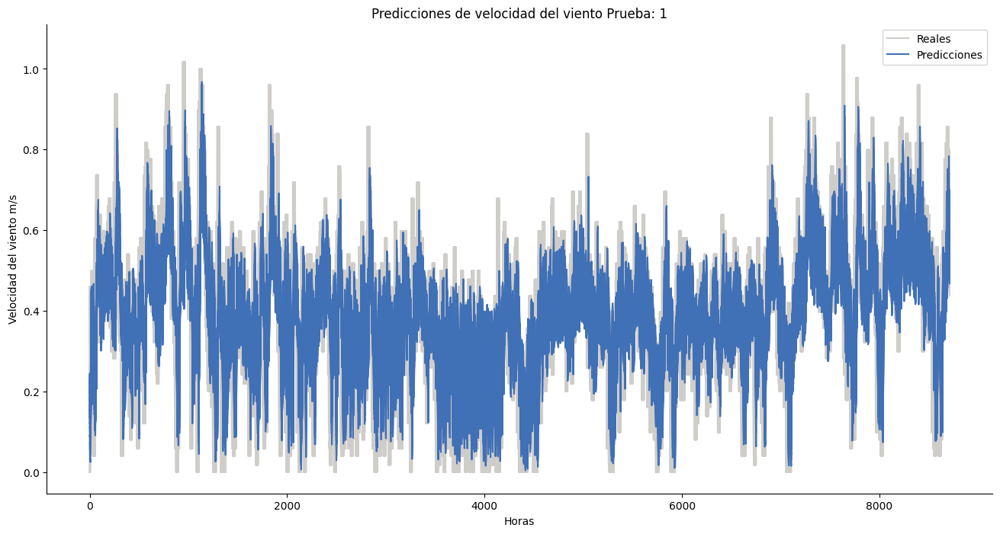

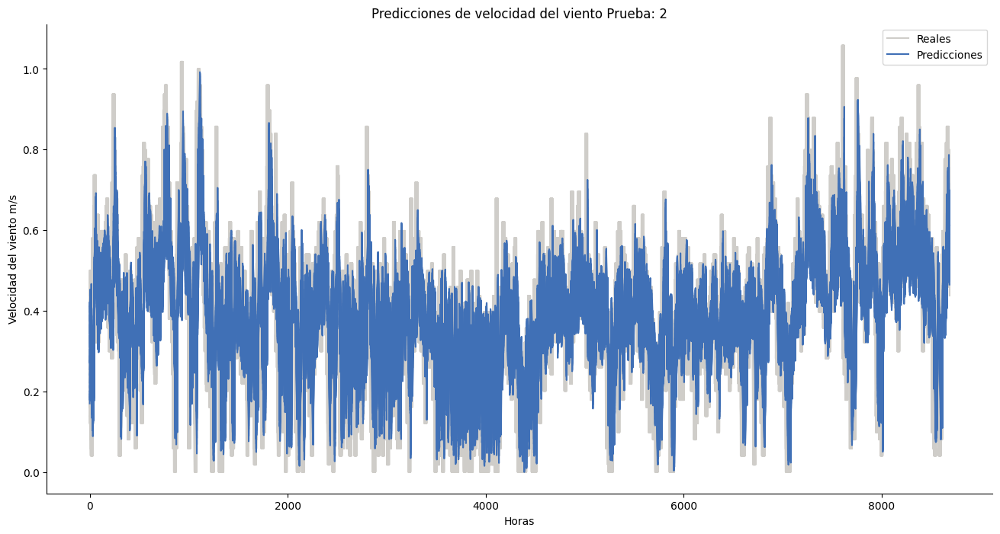

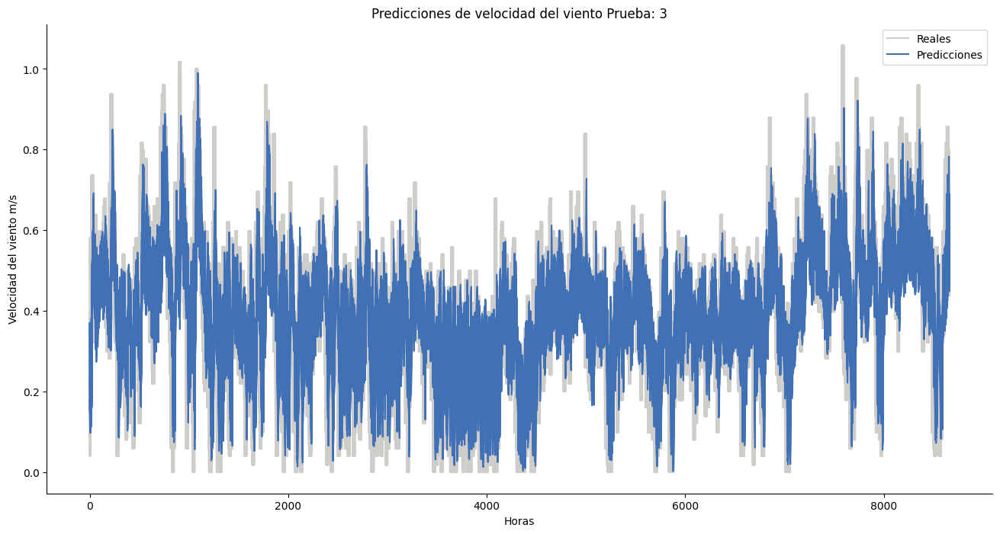

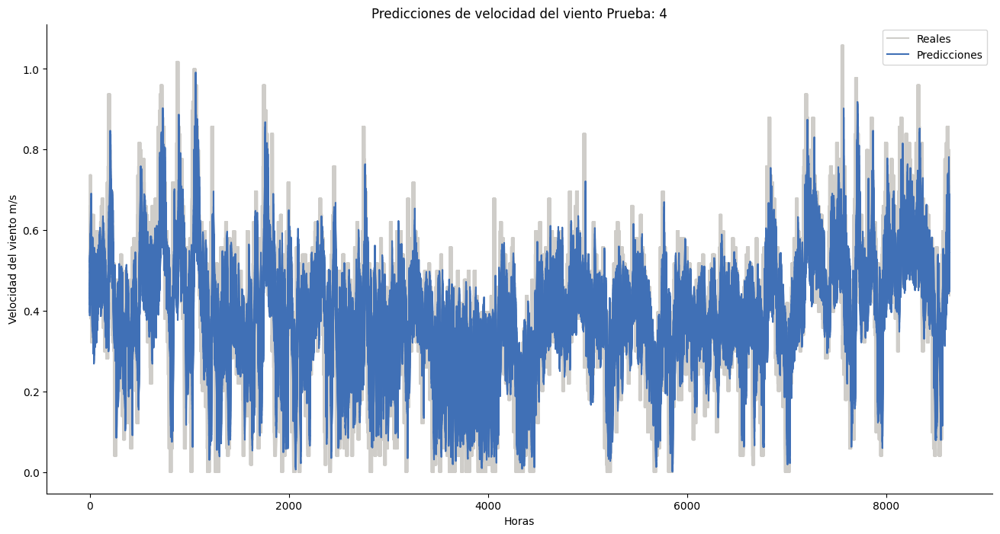

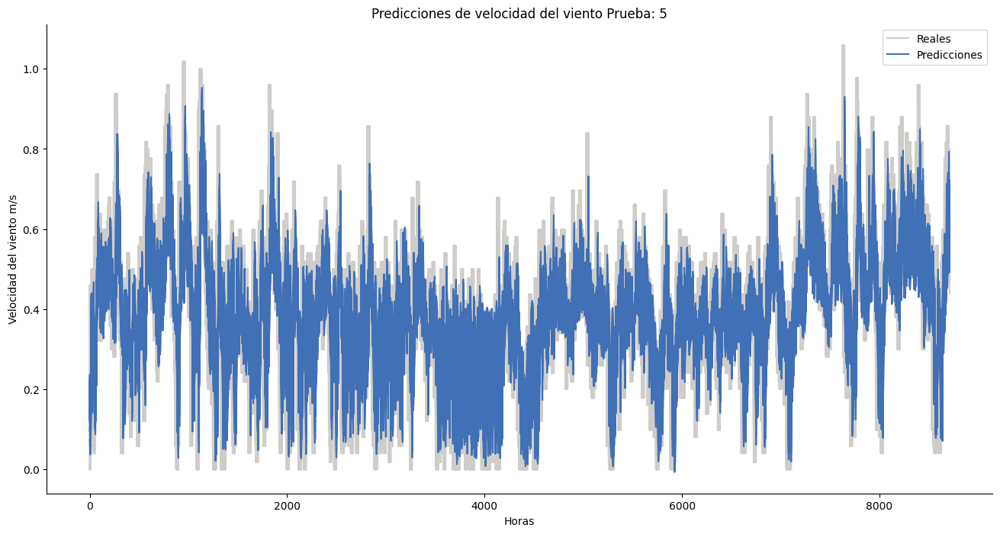

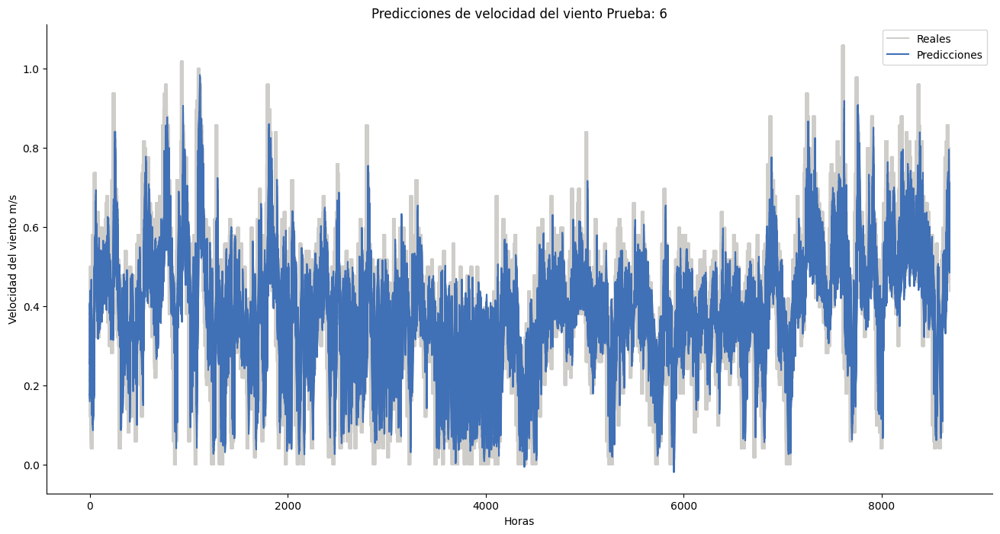

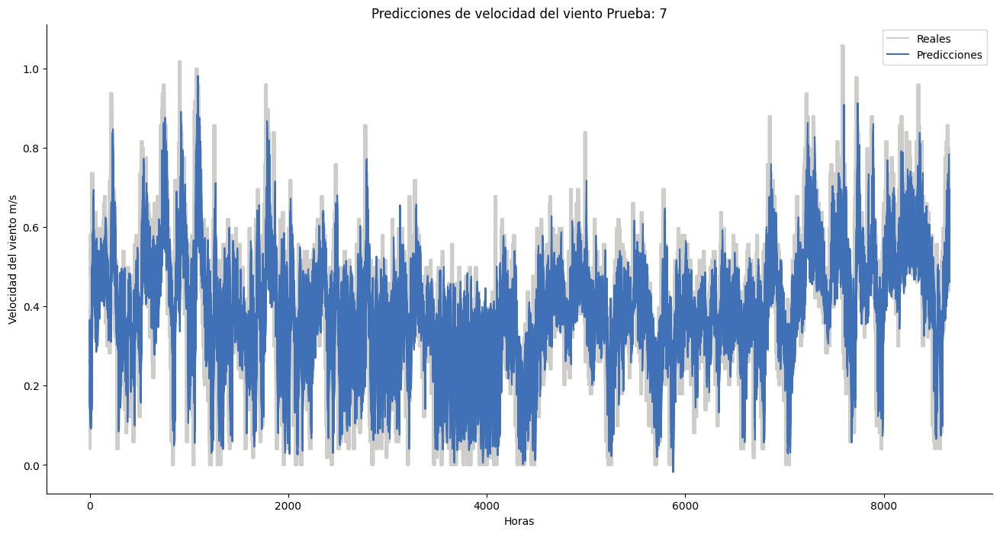

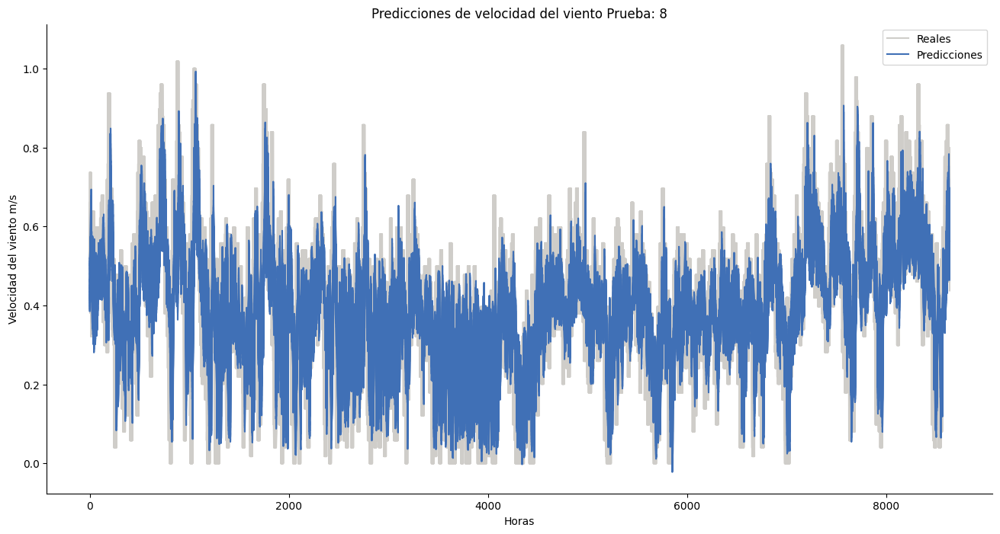

In [56]:
# Realizacion de todas las combinaciones de los experminetos de entrenamiento (CHECAR BIEN EL CODIGO)
#def run_test(data, window, horizon, shift, scaler, target, model):
model = LinearRegression()
minmax_scl = MinMaxScaler()

#DEBUG
#comb = list_mimo[0] # MULTIVARIADO W = 96, H = 24
for i, comb in enumerate(list_mimo):
    df_ = df_Nizanda_D1.copy()
    drop_cols = [col for col in df_Nizanda_D1.columns if col not in comb[0]]
    df_.drop(drop_cols, axis = 1, inplace = True)
    
    
    df_test = df_Nizanda_D23.copy()
    drop_cols = [col for col in df_Nizanda_D23.columns if col not in comb[0]]
    df_test.drop(drop_cols, axis = 1, inplace = True)
    
    minmax_scl.fit(df_)
    
    print('---Test Experiment: ', str(i + 1) + '---')
    
    #Entrenamiento
    w, n_cols = data_preprocessing(df_, minmax_scl)
    x_train, y_train = make_windows(w, input_size = comb[1], horizon = comb[2], shift = 0,  n_cols = n_cols)
    
    
    #Prueba
    w_test, n_cols = data_preprocessing(df_test, minmax_scl)
    x_test, y_test = make_windows(w_test, input_size = comb[1], horizon = comb[2], shift = 0,  n_cols = n_cols)
    
    
    if len(x_train.shape) > 2:
        # Convertir a arreglo de 2 dimensiones
        rows, nx, ny = x_train.shape
        x_train = x_train.reshape((rows, nx*ny))
        
        rows, nx, ny = x_test.shape
        x_test = x_test.reshape((rows, nx*ny))
        
        
    model.fit(x_train, y_train)
    
    y_pred = model.predict(x_test)
     
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared= False)
        
    plot_series(y_test, y_pred, title = 'Predicciones de velocidad del viento ' + 'Prueba: ' + str(i + 1))
    
    df_LR_test.loc[len(df_LR_test.index)] = {'Modelo': 'LR', 
                                             'Horizon': comb[2], 
                                             'R2': r2, 
                                             'RMSE': rmse, 
                                             'MAE': mae, 
                                             'Params': str(comb[0]) +' ' +str(comb[1]) +' ' +str(comb[2])}
    print('Runs experiment finished')

In [18]:
df_LR_test

,Modelo,Horizon,R2,RSME,MAE,Params
0,LR,1,0.832712,0.074074,0.056520,"[[Month, Day, Hour, High Wind Speed m/s], 24, 1]"
1,LR,1,0.834393,0.073701,0.056277,"[[Month, Day, Hour, High Wind Speed m/s], 48, 1]"
2,LR,1,0.833546,0.073569,0.056212,"[[Month, Day, Hour, High Wind Speed m/s], 72, 1]"
3,LR,1,0.832237,0.073769,0.056343,"[[Month, Day, Hour, High Wind Speed m/s], 96, 1]"
4,LR,1,0.831128,0.074424,0.056959,"[[High Wind Speed m/s], 24, 1]"
5,LR,1,0.834594,0.073657,0.056410,"[[High Wind Speed m/s], 48, 1]"
6,LR,1,0.834122,0.073441,0.056298,"[[High Wind Speed m/s], 72, 1]"
7,LR,1,0.833903,0.073402,0.056193,"[[High Wind Speed m/s], 96, 1]"
8,LR,24,0.484334,0.128707,0.100372,"[[Month, Day, Hour, High Wind Speed m/s], 24, 24]"
9,LR,24,0.492697,0.127407,0.099588,"[[Month, Day, Hour, High Wind Speed m/s], 48, 24]"


In [57]:
#Con D1
df_LR_test

,Modelo,Horizon,R2,RMSE,MAE,Params
0,LR,1,0.813016,0.075564,0.057859,"['Month', 'Day', 'Hour', 'High Wind Speed m/s'..."
1,LR,1,0.813493,0.075359,0.057535,"['Month', 'Day', 'Hour', 'High Wind Speed m/s'..."
2,LR,1,0.812897,0.075493,0.057640,"['Month', 'Day', 'Hour', 'High Wind Speed m/s'..."
3,LR,1,0.812479,0.075516,0.057672,"['Month', 'Day', 'Hour', 'High Wind Speed m/s'..."
4,LR,1,0.808770,0.076417,0.058568,['High Wind Speed m/s'] 24 1
5,LR,1,0.812050,0.075650,0.057735,['High Wind Speed m/s'] 48 1
6,LR,1,0.811961,0.075682,0.057810,['High Wind Speed m/s'] 72 1
7,LR,1,0.812158,0.075581,0.057712,['High Wind Speed m/s'] 96 1
8,LR,24,0.486185,0.124031,0.095812,"['Month', 'Day', 'Hour', 'High Wind Speed m/s'..."
9,LR,24,0.490224,0.123519,0.095213,"['Month', 'Day', 'Hour', 'High Wind Speed m/s'..."


In [19]:
df_LR_test.to_csv(r'C:\Users\Angel-PC\Documents\Tesis\Notebooks\Resultados\LR_Resultados-2024.csv')

### Experimento: Simulacion

In [23]:
P_Enero = df_Nizanda_D23[df_Nizanda_D23['Month'] == 1]
P_Febrero = df_Nizanda_D23[df_Nizanda_D23['Month'] == 2]
P_Marzo = df_Nizanda_D23[df_Nizanda_D23['Month'] == 3]
P_Abril = df_Nizanda_D23[df_Nizanda_D23['Month'] == 4]
P_Mayo = df_Nizanda_D23[df_Nizanda_D23['Month'] == 5]
P_Junio = df_Nizanda_D23[df_Nizanda_D23['Month'] == 6]
P_Julio = df_Nizanda_D23[df_Nizanda_D23['Month'] == 7]
P_Agosto = df_Nizanda_D23[df_Nizanda_D23['Month'] == 8]
P_Septiembre = df_Nizanda_D23[df_Nizanda_D23['Month'] == 9]
P_Octubre = df_Nizanda_D23[df_Nizanda_D23['Month'] == 10]
P_Noviembre = df_Nizanda_D23[df_Nizanda_D23['Month'] == 11]
P_Diciembre = df_Nizanda_D23[df_Nizanda_D23['Month'] == 12]

Meses = {
    'Enero': P_Enero, 'Febrero': P_Febrero,
    'Marzo': P_Marzo, 'Abril': P_Abril,
    'Mayo': P_Mayo, 'Junio': P_Junio,
    'Julio': P_Julio, 'Agosto': P_Agosto, 
    'Septiembre': P_Septiembre, 'Octubre': P_Octubre, 
    'Novimebre': P_Noviembre, 'Diciembre': P_Diciembre
    }
keys = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Novimebre', 'Diciembre']

#### Simulacion de todos los meses Recursivo

In [20]:
combi = list_rect[1]
print(combi)

(['Month', 'Day', 'Hour', 'High Wind Speed m/s'], 48, 1)


In [21]:
import warnings
warnings.filterwarnings('ignore')

#combi = list_mimo[1]
print(combi)

inicio = 0
if combi[1] == 24:
    inicio = 2
elif combi[1] == 48:
    inicio = 3
if combi[1] == 72:
    inicio = 4
elif combi[1] == 96:
    inicio = 5
#else:
    #inicio = -1

#df_SVR_test['Params']
#model_parameters = df_SVR_test['Params']
minmax_scl = MinMaxScaler()

df_ = df_Nizanda_D1.copy()
drop_cols = [col for col in df_Nizanda_D1.columns if col not in combi[0]]
df_.drop(drop_cols, axis = 1, inplace = True)

minmax_scl.fit(df_)

w, n_cols = data_preprocessing(df_, minmax_scl)
x_train, y_train = make_windows(w, input_size = combi[1], horizon = combi[2], shift = 0,  n_cols = n_cols)
        
if len(x_train.shape) > 2:
    # Convertir a arreglo de 2 dimensiones
    rows, nx, ny = x_train.shape
    x_train = x_train.reshape((rows, nx*ny))    


#p = model_parameters[5]
#print('---Parametros: ' +  str(model_parameters[5]) + '---')
#model = SVR(C = p['C'][0], epsilon = p['epsilon'][0], gamma = p['gamma'][0], kernel = p['kernel'][0])
model = LinearRegression()
model.fit(x_train, y_train)


for i, mes in enumerate(keys):
    df_mes = Meses[keys[i]]
    for j in range(inicio, len(df_mes['Day'].unique()) + 1):
        #Simulacion
        print(str(i + 1) + ' : ' + str(j))
        m, p, c, pred = simulation_v2(combi, (i + 1), j, model, minmax_scl)
        # Metricas
        r2 = r2_score(c, pred)
        mae = mean_absolute_error(c, pred)
        rmse = mean_squared_error(c, pred, squared= False)
        
        #Insertandolos en el Dataframe
        df_LR_sim.loc[len(df_LR_sim.index)] = [mes, j, r2, rmse, mae, 'LR', 'REC', str(combi), str(p)]
        

(['Month', 'Day', 'Hour', 'High Wind Speed m/s'], 48, 1)
1 : 3
1 : 4
1 : 5
1 : 6
1 : 7
1 : 8
1 : 9
1 : 10
1 : 11
1 : 12
1 : 13
1 : 14
1 : 15
1 : 16
1 : 17
1 : 18
1 : 19
1 : 20
1 : 21
1 : 22
1 : 23
1 : 24
1 : 25
1 : 26
1 : 27
1 : 28
1 : 29
1 : 30
1 : 31
2 : 3
2 : 4
2 : 5
2 : 6
2 : 7
2 : 8
2 : 9
2 : 10
2 : 11
2 : 12
2 : 13
2 : 14
2 : 15
2 : 16
2 : 17
2 : 18
2 : 19
2 : 20
2 : 21
2 : 22
2 : 23
2 : 24
2 : 25
2 : 26
2 : 27
2 : 28
3 : 3
3 : 4
3 : 5
3 : 6
3 : 7
3 : 8
3 : 9
3 : 10
3 : 11
3 : 12
3 : 13
3 : 14
3 : 15
3 : 16
3 : 17
3 : 18
3 : 19
3 : 20
3 : 21
3 : 22
3 : 23
3 : 24
3 : 25
3 : 26
3 : 27
3 : 28
3 : 29
3 : 30
3 : 31
4 : 3
4 : 4
4 : 5
4 : 6
4 : 7
4 : 8
4 : 9
4 : 10
4 : 11
4 : 12
4 : 13
4 : 14
4 : 15
4 : 16
4 : 17
4 : 18
4 : 19
4 : 20
4 : 21
4 : 22
4 : 23
4 : 24
4 : 25
4 : 26
4 : 27
4 : 28
4 : 29
4 : 30
5 : 3
5 : 4
5 : 5
5 : 6
5 : 7
5 : 8
5 : 9
5 : 10
5 : 11
5 : 12
5 : 13
5 : 14
5 : 15
5 : 16
5 : 17
5 : 18
5 : 19
5 : 20
5 : 21
5 : 22
5 : 23
5 : 24
5 : 25
5 : 26
5 : 27
5 : 28
5 : 29
5 : 3

In [22]:
df_LR_sim_rec = df_LR_sim[df_LR_sim['Metodo'] == 'REC']

In [55]:
df_LR_sim_rec

,Mes,Dia,R2,RMSE,MAE,Modelo,Metodo,Comb,Pronostico
0,Enero,5,-0.319092,0.074464,0.063504,LR,REC,"([High Wind Speed m/s], 96, 1)","[5.4, 4.9, 4.5, 4.0, 4.5, 2.7, 1.8, 1.8, 4.5, ..."
1,Enero,6,-4.297557,0.243071,0.219010,LR,REC,"([High Wind Speed m/s], 96, 1)","[4.0, 5.4, 3.6, 2.7, 2.2, 2.7, 2.7, 1.8, 2.2, ..."
2,Enero,7,-9.637212,0.173479,0.161311,LR,REC,"([High Wind Speed m/s], 96, 1)","[14.8, 14.3, 13.9, 13.4, 14.8, 16.5, 15.6, 17...."
3,Enero,8,-1.893698,0.113541,0.090886,LR,REC,"([High Wind Speed m/s], 96, 1)","[15.2, 13.4, 16.1, 17.9, 14.8, 16.5, 14.3, 14...."
4,Enero,9,-0.246308,0.116129,0.081527,LR,REC,"([High Wind Speed m/s], 96, 1)","[11.2, 10.7, 11.6, 8.9, 9.4, 8.5, 8.9, 8.9, 8...."
...,...,...,...,...,...,...,...,...,...
312,Diciembre,27,-0.376550,0.116148,0.097748,LR,REC,"([High Wind Speed m/s], 96, 1)","[9.8, 11.2, 11.2, 8.9, 9.8, 10.7, 11.6, 9.4, 9..."
313,Diciembre,28,-4.499939,0.126574,0.116072,LR,REC,"([High Wind Speed m/s], 96, 1)","[13.9, 13.4, 17.4, 19.2, 17.0, 18.8, 15.6, 18...."
314,Diciembre,29,-4.844351,0.256575,0.233361,LR,REC,"([High Wind Speed m/s], 96, 1)","[18.3, 21.0, 19.2, 18.3, 18.8, 17.4, 18.8, 17...."
315,Diciembre,30,0.469029,0.089201,0.071941,LR,REC,"([High Wind Speed m/s], 96, 1)","[16.5, 14.8, 15.6, 13.9, 13.0, 12.1, 12.1, 11...."


In [22]:
#D2023
df_LR_sim_rec = df_LR_sim[df_LR_sim['Metodo'] == 'REC']
df_LR_sim_rec

,Mes,Dia,R2,RMSE,MAE,Modelo,Metodo,Comb,Pronostico
0,Enero,3,-5.424963,0.264077,0.197324,LR,REC,"(['Month', 'Day', 'Hour', 'High Wind Speed m/s...",[ 7.6 6.7 7.6 8. 7.6 10.3 8.5 10.7 9.4 ...
1,Enero,4,-0.838320,0.228219,0.195394,LR,REC,"(['Month', 'Day', 'Hour', 'High Wind Speed m/s...",[ 0.9 0. 0. 0. 0. 0. 0. 1.3 2.2 ...
2,Enero,5,-2.024339,0.124901,0.097633,LR,REC,"(['Month', 'Day', 'Hour', 'High Wind Speed m/s...",[ 4. 3.6 4.9 6.3 5.8 4.5 4.9 5.4 3.6 ...
3,Enero,6,-7.901311,0.243837,0.210231,LR,REC,"(['Month', 'Day', 'Hour', 'High Wind Speed m/s...",[ 3.6 2.2 1.8 2.2 2.2 2.2 1.3 1.3 0.9 ...
4,Enero,7,-1.543534,0.124116,0.102539,LR,REC,"(['Month', 'Day', 'Hour', 'High Wind Speed m/s...",[11.2 10.7 11.6 12.1 12.1 10.7 10.7 11.2 9.8 ...
...,...,...,...,...,...,...,...,...,...
336,Diciembre,27,-3.723042,0.277607,0.221764,LR,REC,"(['Month', 'Day', 'Hour', 'High Wind Speed m/s...",[ 1.3 1.3 1.3 1.8 1.3 1.8 2.2 1.3 1.3 ...
337,Diciembre,28,-11.600165,0.237061,0.208814,LR,REC,"(['Month', 'Day', 'Hour', 'High Wind Speed m/s...",[10.7 8.9 10.7 12.5 10.3 8.5 7.6 8.5 9.4 ...
338,Diciembre,29,-2.168100,0.160763,0.133302,LR,REC,"(['Month', 'Day', 'Hour', 'High Wind Speed m/s...",[ 7.6 7.2 4.5 2.2 2.7 1.8 1.3 1.8 0.9 ...
339,Diciembre,30,-4.480497,0.216652,0.182103,LR,REC,"(['Month', 'Day', 'Hour', 'High Wind Speed m/s...",[ 7.2 9.8 10.3 9.8 10.3 8.9 11.2 11.6 10.7 ...


In [23]:
sns.set(rc={'figure.figsize':(14,5)})

<Axes: xlabel='Mes', ylabel='R2'>

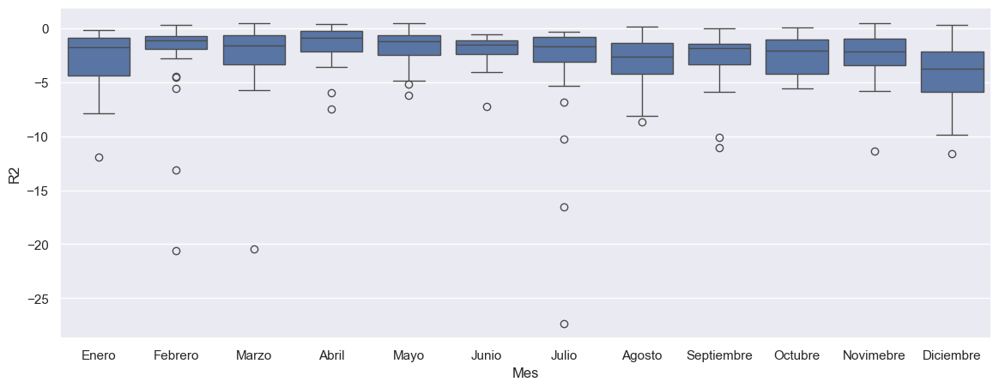

In [24]:
sns.boxplot(data = df_LR_sim_rec, x = 'Mes', y = 'R2')

<Axes: xlabel='Mes', ylabel='RMSE'>

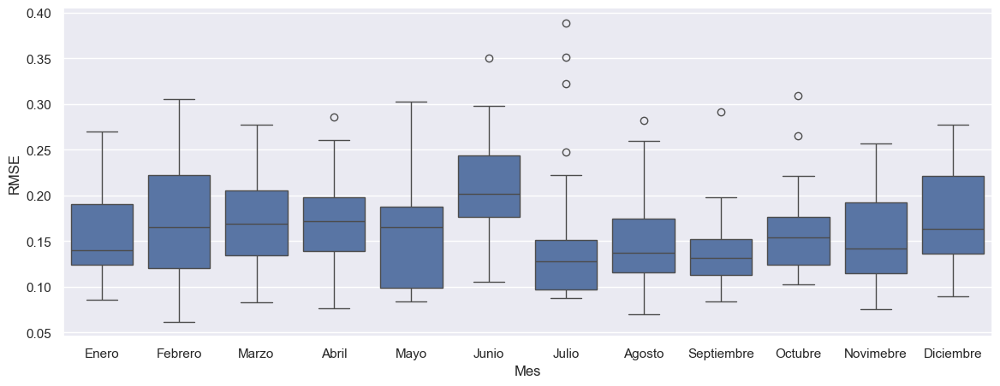

In [25]:
sns.boxplot(data = df_LR_sim_rec, x = 'Mes', y = 'RMSE')

<Axes: xlabel='Mes', ylabel='MAE'>

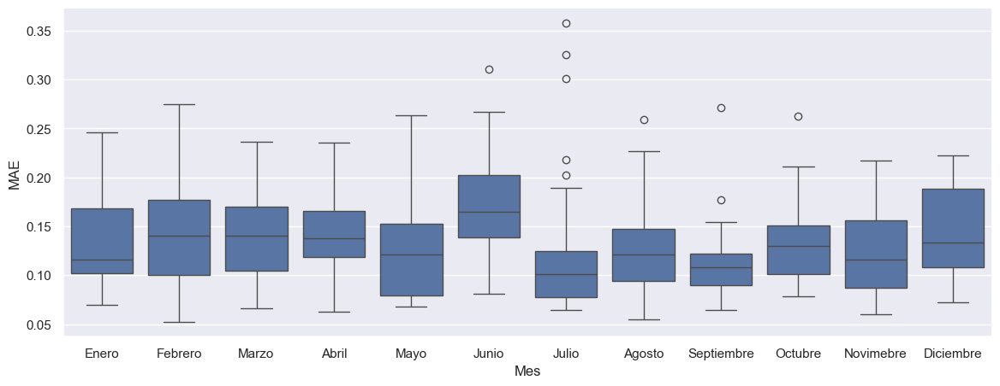

In [26]:
sns.boxplot(data = df_LR_sim_rec, x = 'Mes', y = 'MAE')

In [27]:
df_LR_sim_rec.to_csv(r'C:\Users\Angel-PC\Documents\Tesis\Notebooks\Resultados\LR_sim_rec-2024.csv')

#### Simulacion de todos los meses MIMO

In [18]:
combi = list_mimo[7]
print(combi)

(['High Wind Speed m/s'], 96, 24)


In [29]:
import warnings
warnings.filterwarnings('ignore')

#combi = list_mimo[1]
print(combi)

inicio = 0
if combi[1] == 24:
    inicio = 2
elif combi[1] == 48:
    inicio = 3
if combi[1] == 72:
    inicio = 4
elif combi[1] == 96:
    inicio = 5
#else:
    #inicio = -1

#df_SVR_test['Params']
#model_parameters = df_SVR_test['Params']
minmax_scl = MinMaxScaler()

df_ = df_Nizanda_D1.copy()
drop_cols = [col for col in df_Nizanda_D1.columns if col not in combi[0]]
df_.drop(drop_cols, axis = 1, inplace = True)

minmax_scl.fit(df_)

w, n_cols = data_preprocessing(df_, minmax_scl)
x_train, y_train = make_windows(w, input_size = combi[1], horizon = combi[2], shift = 0,  n_cols = n_cols)
        
if len(x_train.shape) > 2:
    # Convertir a arreglo de 2 dimensiones
    rows, nx, ny = x_train.shape
    x_train = x_train.reshape((rows, nx*ny))    


#p = model_parameters[5]
#print('---Parametros: ' +  str(model_parameters[5]) + '---')
#model = SVR(C = p['C'][0], epsilon = p['epsilon'][0], gamma = p['gamma'][0], kernel = p['kernel'][0])
model = LinearRegression()
model.fit(x_train, y_train)


for i, mes in enumerate(keys):
    df_mes = Meses[keys[i]]
    for j in range(inicio, len(df_mes['Day'].unique()) + 1):
        #Simulacion
        print(str(i + 1) + ' : ' + str(j))
        m, p, c, pred = simulation_v2(combi, (i + 1), j, model, minmax_scl)
        # Metricas
        r2 = r2_score(c, pred)
        mae = mean_absolute_error(c, pred)
        rmse = mean_squared_error(c, pred, squared= False)
        
        #Insertandolos en el Dataframe
        df_LR_sim.loc[len(df_LR_sim.index)] = [mes, j, r2, rmse, mae, 'LR', 'MIMO', str(combi), str(p)]

(['High Wind Speed m/s'], 96, 24)
1 : 5
1 : 6
1 : 7
1 : 8
1 : 9
1 : 10
1 : 11
1 : 12
1 : 13
1 : 14
1 : 15
1 : 16
1 : 17
1 : 18
1 : 19
1 : 20
1 : 21
1 : 22
1 : 23
1 : 24
1 : 25
1 : 26
1 : 27
1 : 28
1 : 29
1 : 30
1 : 31
2 : 5
2 : 6
2 : 7
2 : 8
2 : 9
2 : 10
2 : 11
2 : 12
2 : 13
2 : 14
2 : 15
2 : 16
2 : 17
2 : 18
2 : 19
2 : 20
2 : 21
2 : 22
2 : 23
2 : 24
2 : 25
2 : 26
2 : 27
2 : 28
3 : 5
3 : 6
3 : 7
3 : 8
3 : 9
3 : 10
3 : 11
3 : 12
3 : 13
3 : 14
3 : 15
3 : 16
3 : 17
3 : 18
3 : 19
3 : 20
3 : 21
3 : 22
3 : 23
3 : 24
3 : 25
3 : 26
3 : 27
3 : 28
3 : 29
3 : 30
3 : 31
4 : 5
4 : 6
4 : 7
4 : 8
4 : 9
4 : 10
4 : 11
4 : 12
4 : 13
4 : 14
4 : 15
4 : 16
4 : 17
4 : 18
4 : 19
4 : 20
4 : 21
4 : 22
4 : 23
4 : 24
4 : 25
4 : 26
4 : 27
4 : 28
4 : 29
4 : 30
5 : 5
5 : 6
5 : 7
5 : 8
5 : 9
5 : 10
5 : 11
5 : 12
5 : 13
5 : 14
5 : 15
5 : 16
5 : 17
5 : 18
5 : 19
5 : 20
5 : 21
5 : 22
5 : 23
5 : 24
5 : 25
5 : 26
5 : 27
5 : 28
5 : 29
5 : 30
5 : 31
6 : 5
6 : 6
6 : 7
6 : 8
6 : 9
6 : 10
6 : 11
6 : 12
6 : 13
6 : 14
6 : 15
6 

In [30]:
df_LR_sim_mimo = df_LR_sim[df_LR_sim['Metodo'] == 'MIMO']

In [31]:
#D2023
df_LR_sim_mimo

,Mes,Dia,R2,RMSE,MAE,Modelo,Metodo,Comb,Pronostico
341,Enero,5,-2.090420,0.126258,0.113286,LR,MIMO,"(['High Wind Speed m/s'], 96, 24)",[ 7.6 6.7 7.6 8. 7.6 10.3 8.5 10.7 9.4 ...
342,Enero,6,-0.641485,0.104711,0.089066,LR,MIMO,"(['High Wind Speed m/s'], 96, 24)",[ 0.9 0. 0. 0. 0. 0. 0. 1.3 2.2 ...
343,Enero,7,0.025965,0.076806,0.059826,LR,MIMO,"(['High Wind Speed m/s'], 96, 24)",[ 4. 3.6 4.9 6.3 5.8 4.5 4.9 5.4 3.6 ...
344,Enero,8,-2.009687,0.105016,0.089736,LR,MIMO,"(['High Wind Speed m/s'], 96, 24)",[ 3.6 2.2 1.8 2.2 2.2 2.2 1.3 1.3 0.9 ...
345,Enero,9,-0.796391,0.072473,0.061098,LR,MIMO,"(['High Wind Speed m/s'], 96, 24)",[11.2 10.7 11.6 12.1 12.1 10.7 10.7 11.2 9.8 ...
...,...,...,...,...,...,...,...,...,...
653,Diciembre,27,-0.530058,0.158006,0.132232,LR,MIMO,"(['High Wind Speed m/s'], 96, 24)",[10.7 8.5 8.9 9.4 10.3 11.6 11.2 9.4 8.9 ...
654,Diciembre,28,-16.344260,0.278131,0.269984,LR,MIMO,"(['High Wind Speed m/s'], 96, 24)",[10.7 13. 12.1 11.6 11.2 11.6 10.3 9.4 4.9 ...
655,Diciembre,29,-2.870715,0.177698,0.150311,LR,MIMO,"(['High Wind Speed m/s'], 96, 24)",[ 1.3 1.3 1.3 1.8 1.3 1.8 2.2 1.3 1.3 ...
656,Diciembre,30,-1.070966,0.133180,0.108621,LR,MIMO,"(['High Wind Speed m/s'], 96, 24)",[10.7 8.9 10.7 12.5 10.3 8.5 7.6 8.5 9.4 ...


In [31]:
df_LR_sim_mimo

,Mes,Dia,R2,RMSE,MAE,Modelo,Metodo,Comb,Pronostico
317,Enero,5,-0.505698,0.079557,0.067069,LR,MIMO,"([High Wind Speed m/s], 96, 24)","[5.4, 4.9, 4.5, 4.0, 4.5, 2.7, 1.8, 1.8, 4.5, ..."
318,Enero,6,-4.577786,0.249418,0.225705,LR,MIMO,"([High Wind Speed m/s], 96, 24)","[4.0, 5.4, 3.6, 2.7, 2.2, 2.7, 2.7, 1.8, 2.2, ..."
319,Enero,7,-9.857271,0.175265,0.164760,LR,MIMO,"([High Wind Speed m/s], 96, 24)","[14.8, 14.3, 13.9, 13.4, 14.8, 16.5, 15.6, 17...."
320,Enero,8,-1.571004,0.107023,0.086817,LR,MIMO,"([High Wind Speed m/s], 96, 24)","[15.2, 13.4, 16.1, 17.9, 14.8, 16.5, 14.3, 14...."
321,Enero,9,-0.178707,0.112936,0.079051,LR,MIMO,"([High Wind Speed m/s], 96, 24)","[11.2, 10.7, 11.6, 8.9, 9.4, 8.5, 8.9, 8.9, 8...."
...,...,...,...,...,...,...,...,...,...
629,Diciembre,27,-0.343015,0.114725,0.096108,LR,MIMO,"([High Wind Speed m/s], 96, 24)","[9.8, 11.2, 11.2, 8.9, 9.8, 10.7, 11.6, 9.4, 9..."
630,Diciembre,28,-4.379429,0.125179,0.114201,LR,MIMO,"([High Wind Speed m/s], 96, 24)","[13.9, 13.4, 17.4, 19.2, 17.0, 18.8, 15.6, 18...."
631,Diciembre,29,-4.522333,0.249407,0.226505,LR,MIMO,"([High Wind Speed m/s], 96, 24)","[18.3, 21.0, 19.2, 18.3, 18.8, 17.4, 18.8, 17...."
632,Diciembre,30,0.383047,0.096153,0.076196,LR,MIMO,"([High Wind Speed m/s], 96, 24)","[16.5, 14.8, 15.6, 13.9, 13.0, 12.1, 12.1, 11...."


In [32]:
sns.set(rc={'figure.figsize':(14,5)})

<Axes: xlabel='Mes', ylabel='R2'>

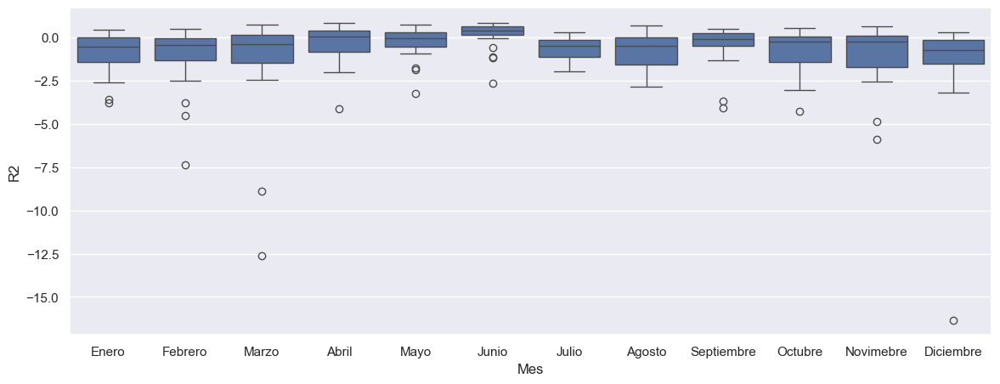

In [33]:
sns.boxplot(data = df_LR_sim_mimo, x = 'Mes', y = 'R2')

<Axes: xlabel='Mes', ylabel='RMSE'>

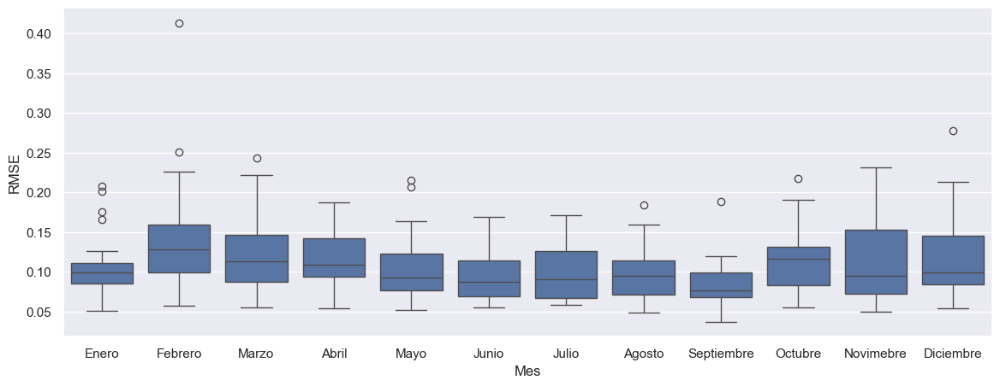

In [34]:
sns.boxplot(data = df_LR_sim_mimo, x = 'Mes', y = 'RMSE')

<Axes: xlabel='Mes', ylabel='MAE'>

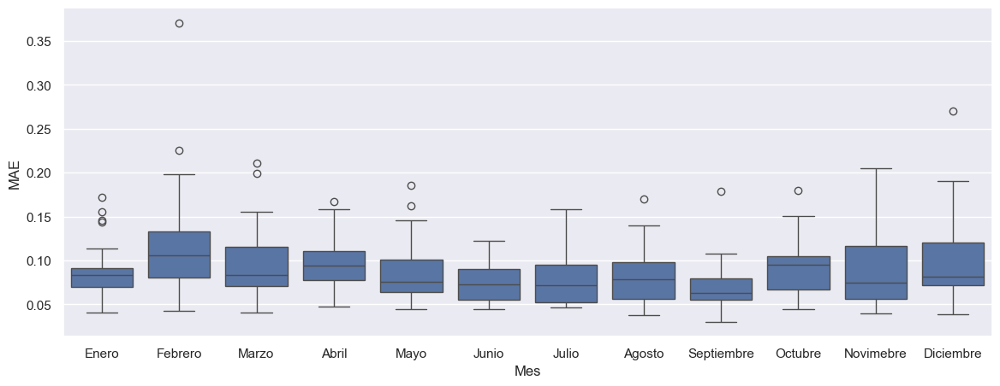

In [35]:
sns.boxplot(data = df_LR_sim_mimo, x = 'Mes', y = 'MAE')

In [36]:
df_LR_sim_mimo.to_csv(r'C:\Users\Angel-PC\Documents\Tesis\Notebooks\Resultados\LR_sim_mimo-2024.csv')

#### Enero 31

##### Simulacion Recursividad

In [43]:
combi = list_rect[7]
print(combi)

inicio = 0
if combi[1] == 24:
    inicio = 2
elif combi[1] == 48:
    inicio = 3
if combi[1] == 72:
    inicio = 4
elif combi[1] == 96:
    inicio = 5

minmax_scl = MinMaxScaler()

df_ = df_Nizanda_D1.copy()
drop_cols = [col for col in df_Nizanda_D1.columns if col not in combi[0]]
df_.drop(drop_cols, axis = 1, inplace = True)

minmax_scl.fit(df_)

w, n_cols = data_preprocessing(df_, minmax_scl)
x_train, y_train = make_windows(w, input_size = combi[1], horizon = combi[2], shift = 0,  n_cols = n_cols)
        
if len(x_train.shape) > 2:
    # Convertir a arreglo de 2 dimensiones
    rows, nx, ny = x_train.shape
    x_train = x_train.reshape((rows, nx*ny))    

model = LinearRegression()
model.fit(x_train, y_train)

(['High Wind Speed m/s'], 96, 1)


LinearRegression()

### Simulacion por dias Recursivo

In [51]:
combi = list_rect[7]
print(combi)

inicio = 0
if combi[1] == 24:
    inicio = 2
elif combi[1] == 48:
    inicio = 3
if combi[1] == 72:
    inicio = 4
elif combi[1] == 96:
    inicio = 5

minmax_scl = MinMaxScaler()

df_ = df_Nizanda_D1.copy()
drop_cols = [col for col in df_Nizanda_D1.columns if col not in combi[0]]
df_.drop(drop_cols, axis = 1, inplace = True)

minmax_scl.fit(df_)

w, n_cols = data_preprocessing(df_, minmax_scl)
x_train, y_train = make_windows(w, input_size = combi[1], horizon = combi[2], shift = 0,  n_cols = n_cols)
        
if len(x_train.shape) > 2:
    # Convertir a arreglo de 2 dimensiones
    rows, nx, ny = x_train.shape
    x_train = x_train.reshape((rows, nx*ny))    

model = LinearRegression()
model.fit(x_train, y_train)

(['High Wind Speed m/s'], 96, 1)


LinearRegression()

#### Enero

Enero


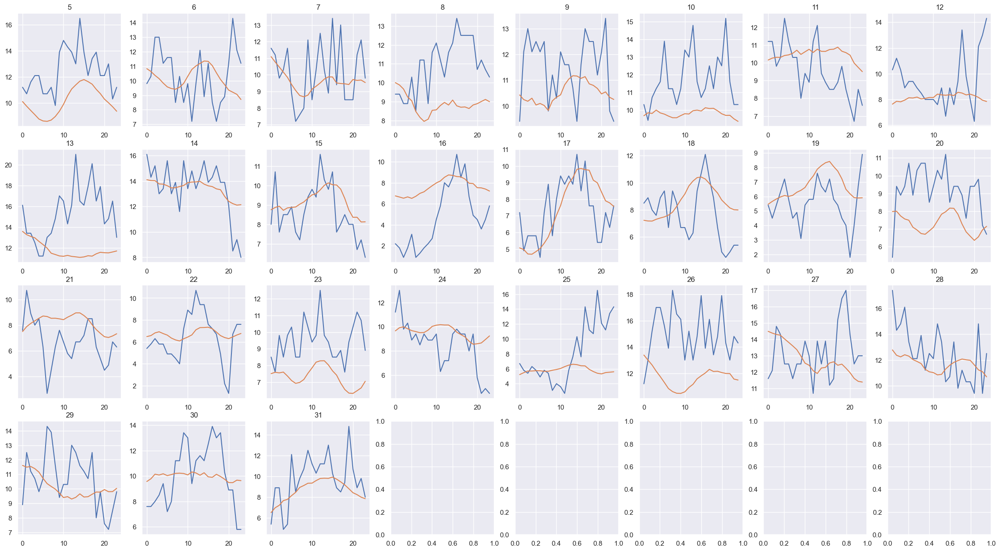

In [52]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[0]] # Enero
print(keys[0])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 1, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Febrero

Febrero


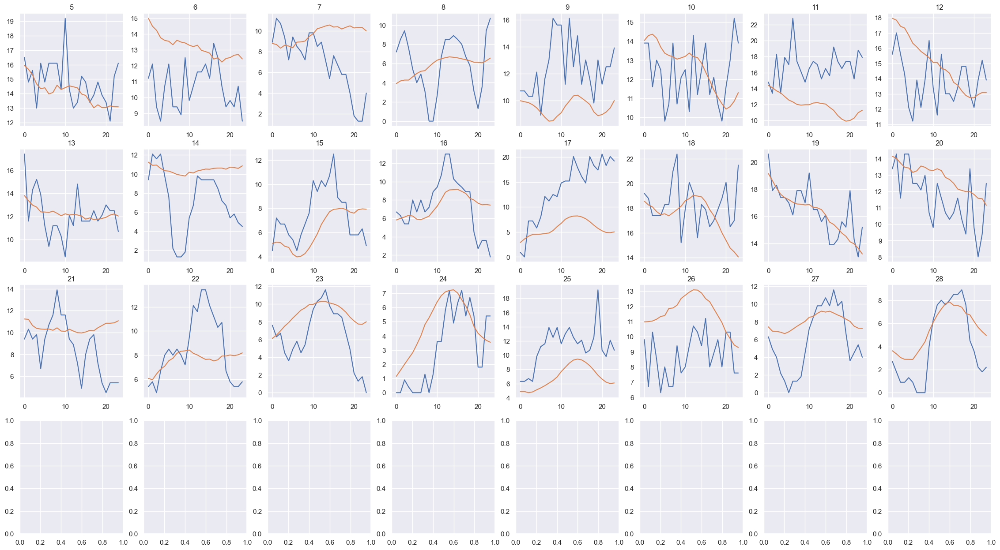

In [53]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[1]] # Febrero
print(keys[1])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 2, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Marzo

Marzo


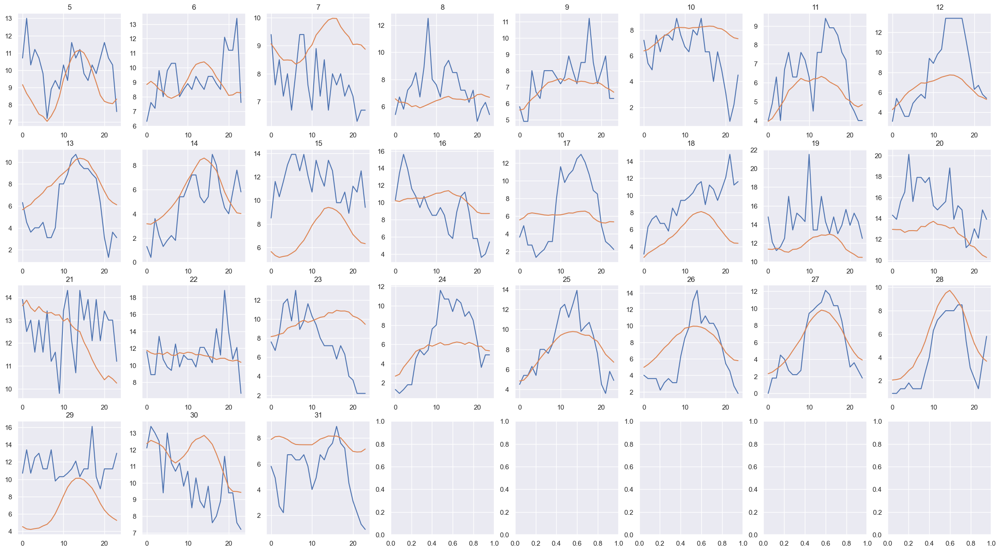

In [54]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[2]] # Marzo
print(keys[2])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 3, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Abril

Abril


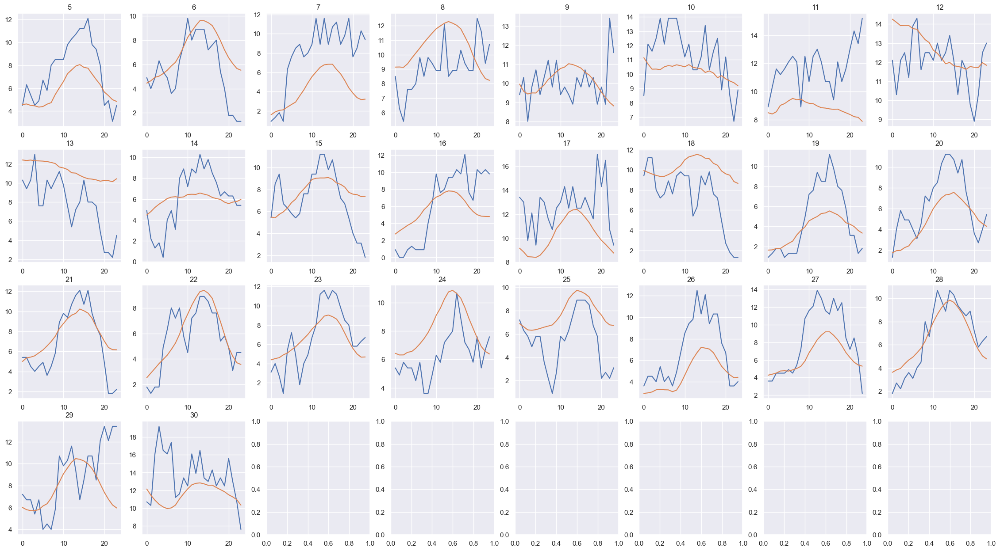

In [55]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[3]] # Abril
print(keys[3])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 4, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Mayo

Mayo


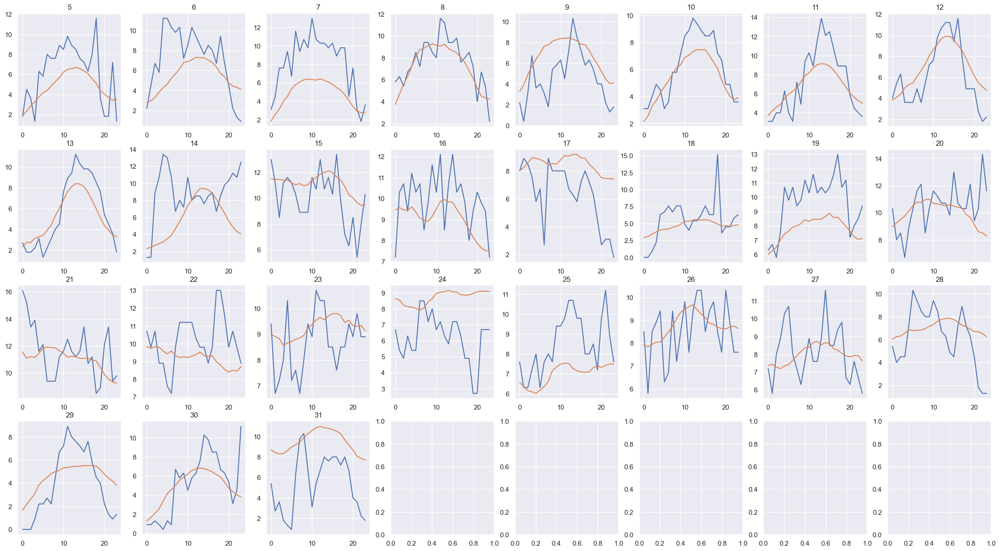

In [56]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[4]] # Mayo
print(keys[4])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 5, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Junio

Junio


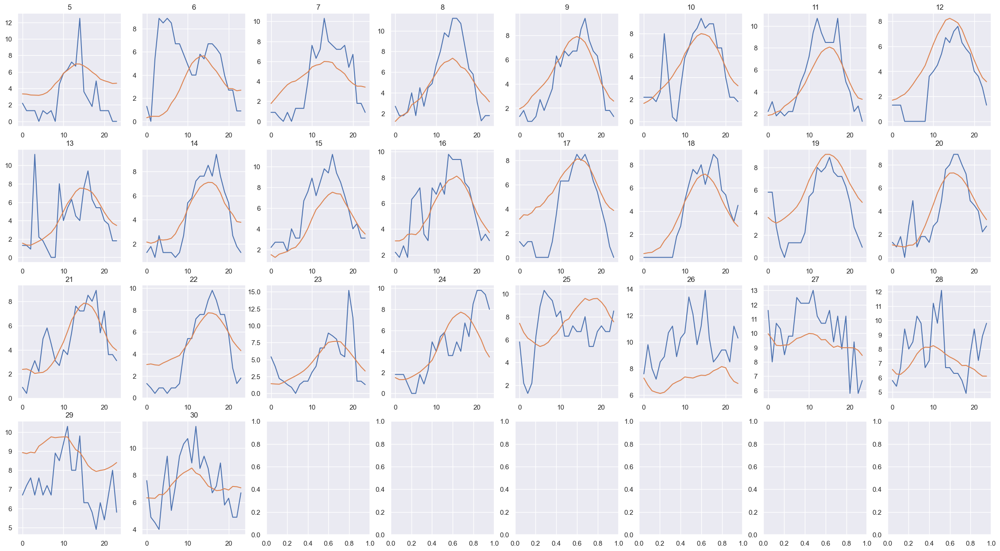

In [57]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[5]] # Junio
print(keys[5])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 6, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Julio

Julio


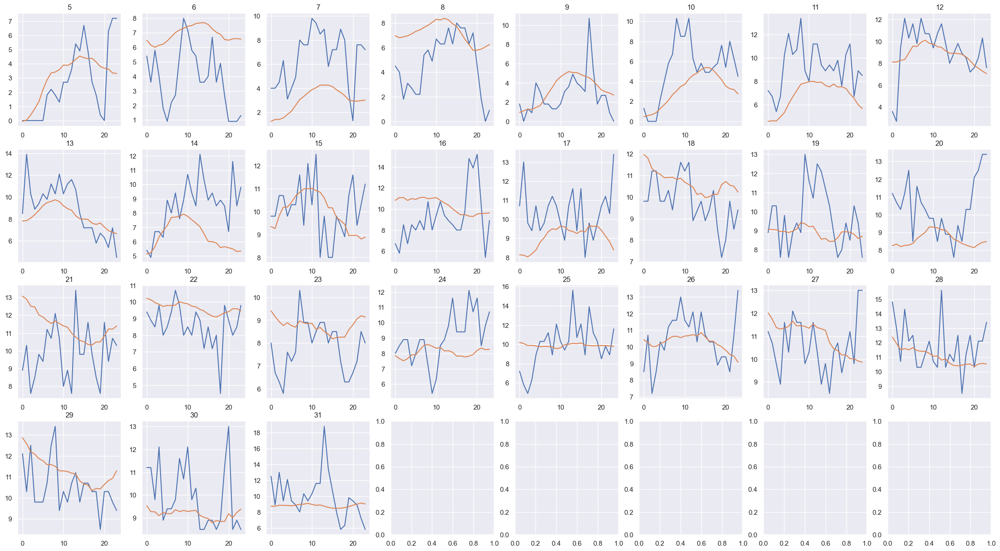

In [58]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[6]] # Julio
print(keys[6])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 7, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Agosto

Agosto


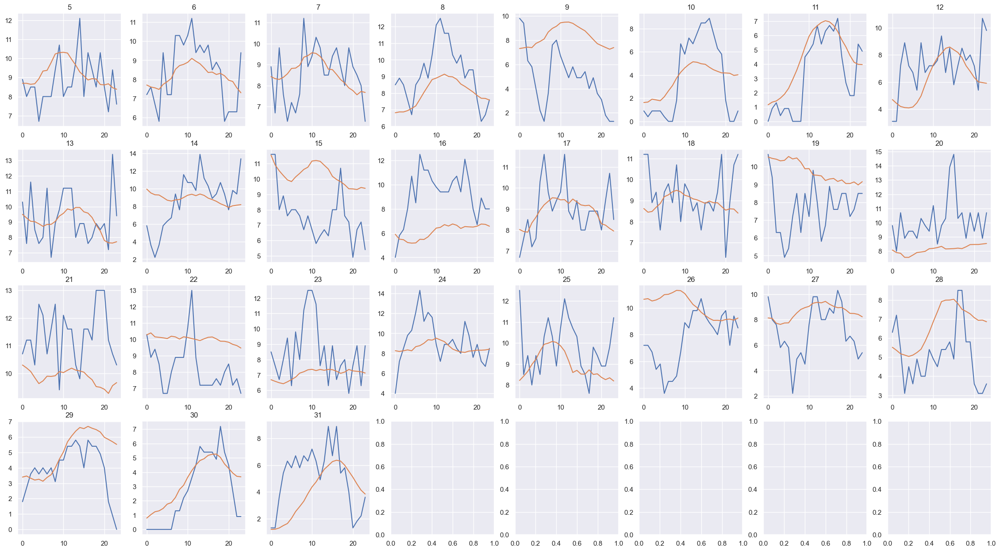

In [59]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[7]] # Julio
print(keys[7])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 8, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Septiembre

Septiembre


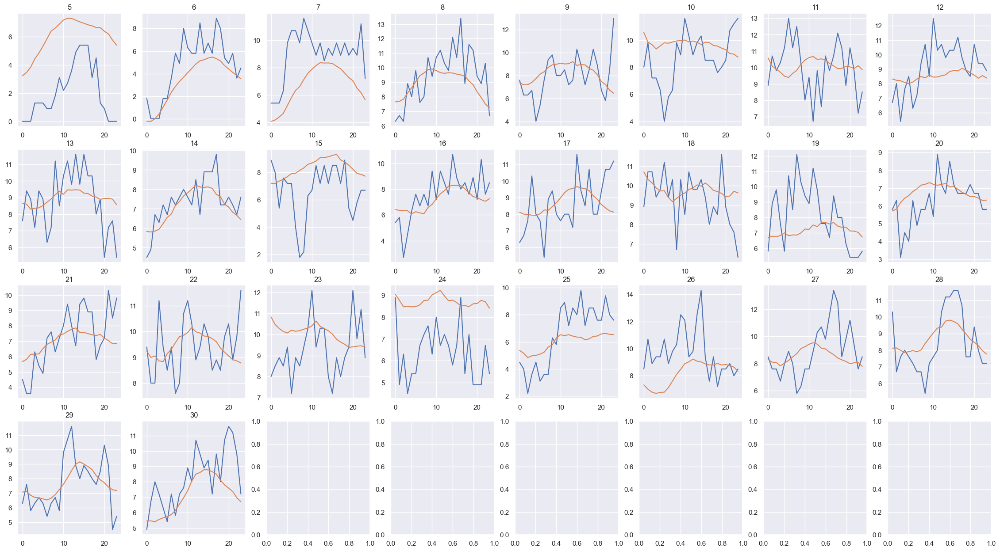

In [60]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[8]] # Julio
print(keys[8])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 9, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Octubre

Octubre


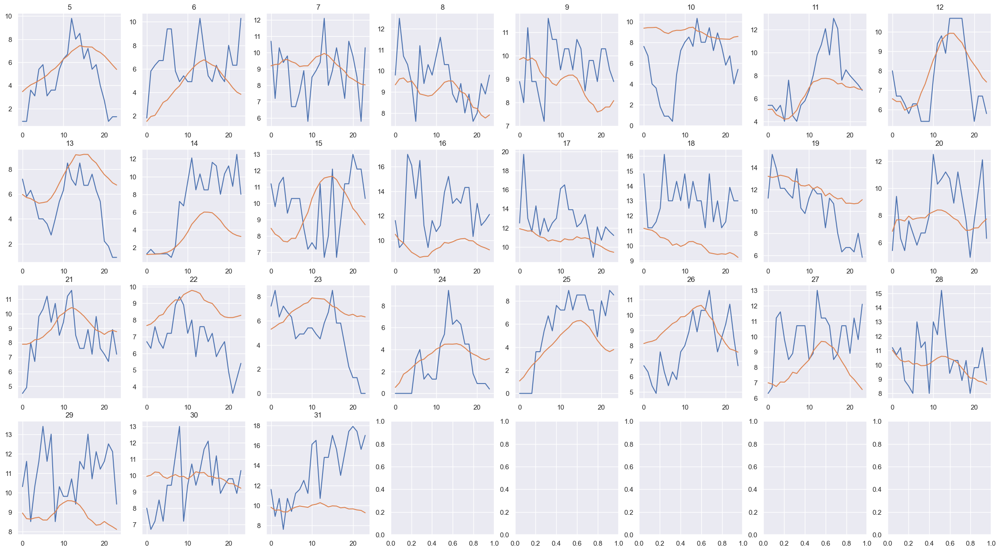

In [61]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[9]] # Julio
print(keys[9])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 10, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Noviembre

Novimebre


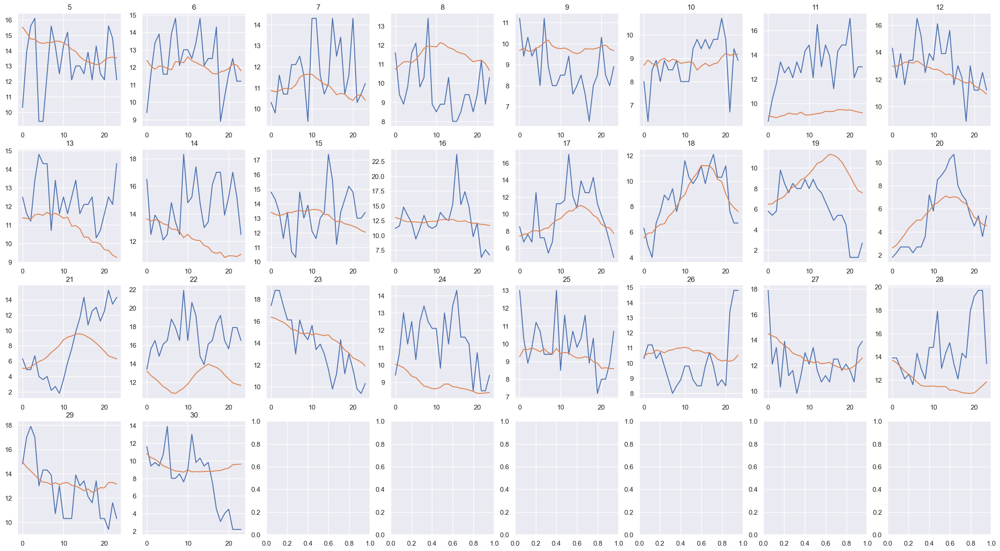

In [62]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[10]] # Noviembre
print(keys[10])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 11, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Diciembre

Diciembre


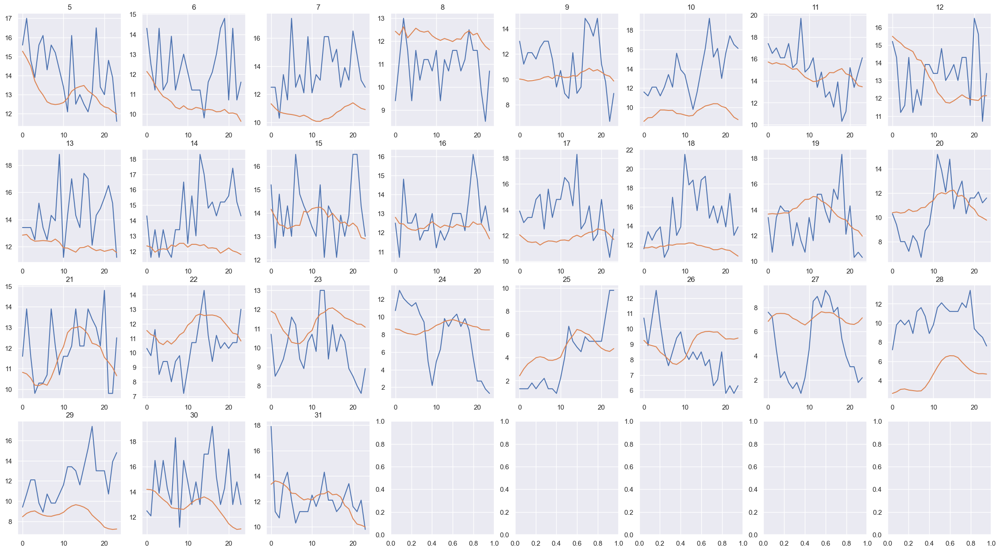

In [63]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[11]] # Diciembre
print(keys[11])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 12, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

### Simulacion por dias MIMO

In [21]:
combi = list_mimo[7]
print(combi)

inicio = 0
if combi[1] == 24:
    inicio = 2
elif combi[1] == 48:
    inicio = 3
if combi[1] == 72:
    inicio = 4
elif combi[1] == 96:
    inicio = 5

minmax_scl = MinMaxScaler()

df_ = df_Nizanda_D1.copy()
drop_cols = [col for col in df_Nizanda_D1.columns if col not in combi[0]]
df_.drop(drop_cols, axis = 1, inplace = True)

minmax_scl.fit(df_)

w, n_cols = data_preprocessing(df_, minmax_scl)
x_train, y_train = make_windows(w, input_size = combi[1], horizon = combi[2], shift = 0,  n_cols = n_cols)
        
if len(x_train.shape) > 2:
    # Convertir a arreglo de 2 dimensiones
    rows, nx, ny = x_train.shape
    x_train = x_train.reshape((rows, nx*ny))    

model = LinearRegression()
model.fit(x_train, y_train)

(['High Wind Speed m/s'], 96, 24)


LinearRegression()

#### Enero

Enero


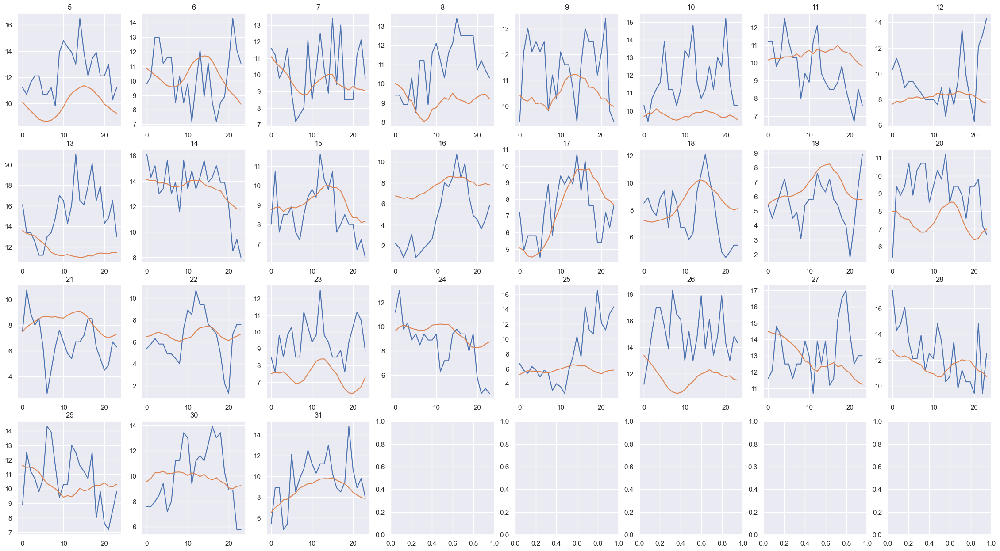

In [66]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[0]] # Enero
print(keys[0])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 1, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Febrero

Febrero


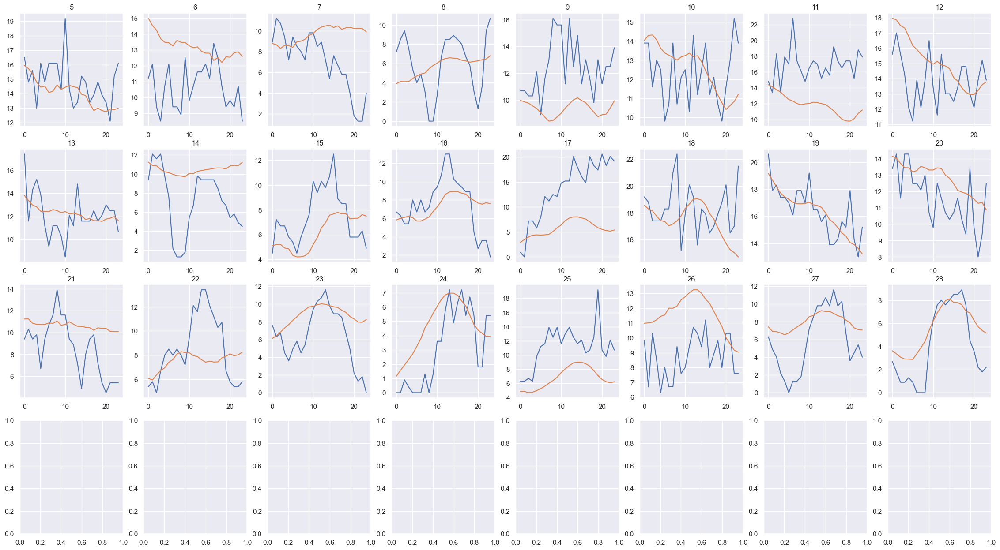

In [68]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[1]] # Febrero
print(keys[1])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 2, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Marzo

Marzo


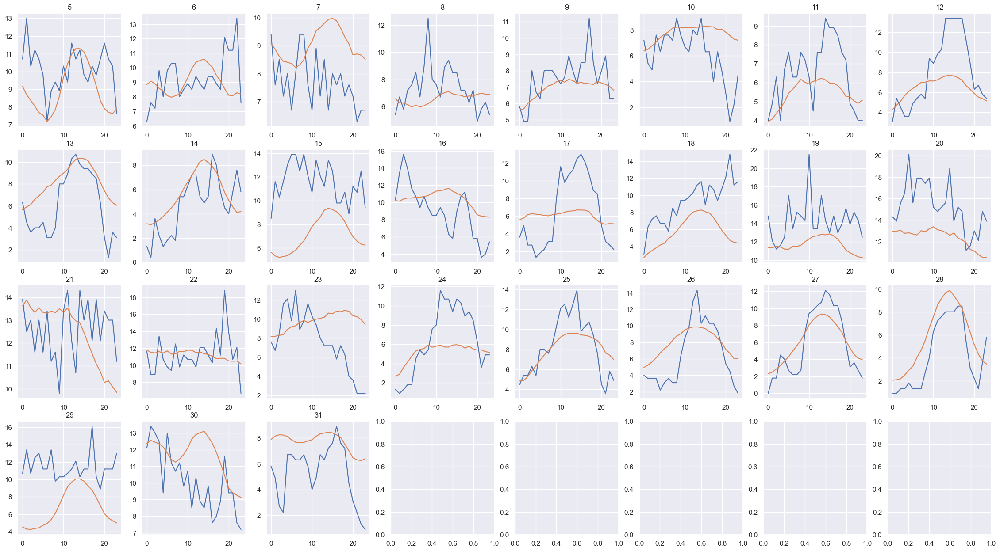

In [69]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[2]] # Marzo
print(keys[2])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 3, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Abril

Abril


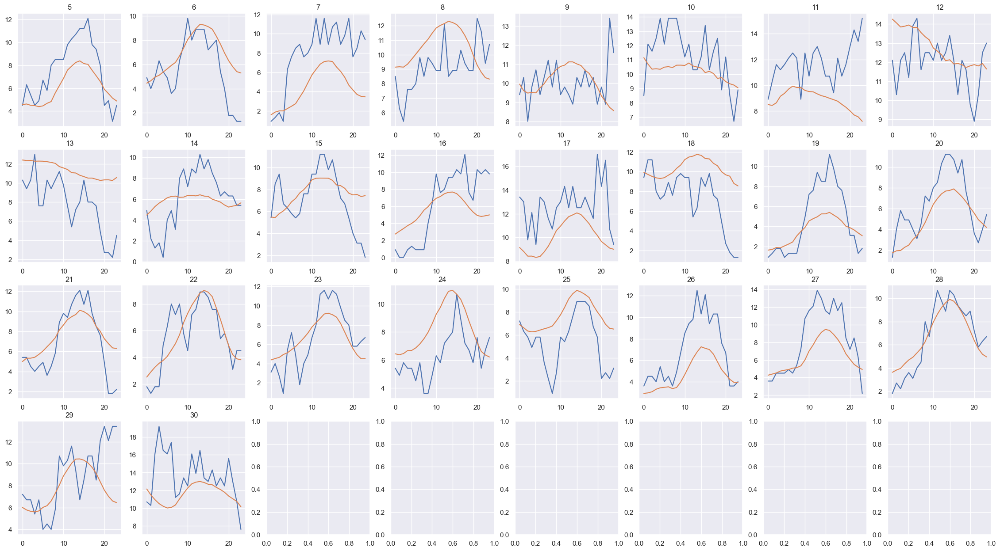

In [70]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[3]] # Abril
print(keys[3])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 4, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Mayo

Mayo


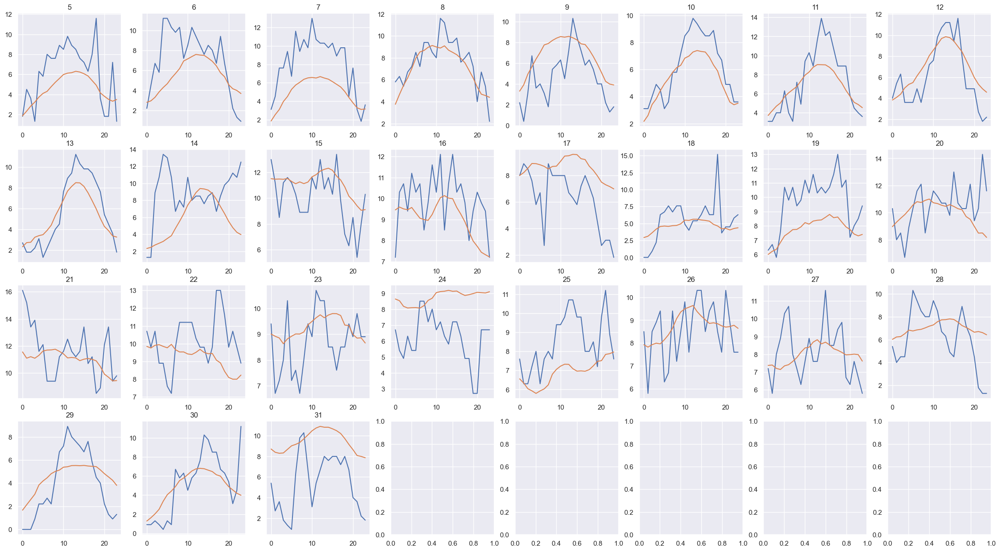

In [71]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[4]] # Mayo
print(keys[4])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 5, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Junio

Junio


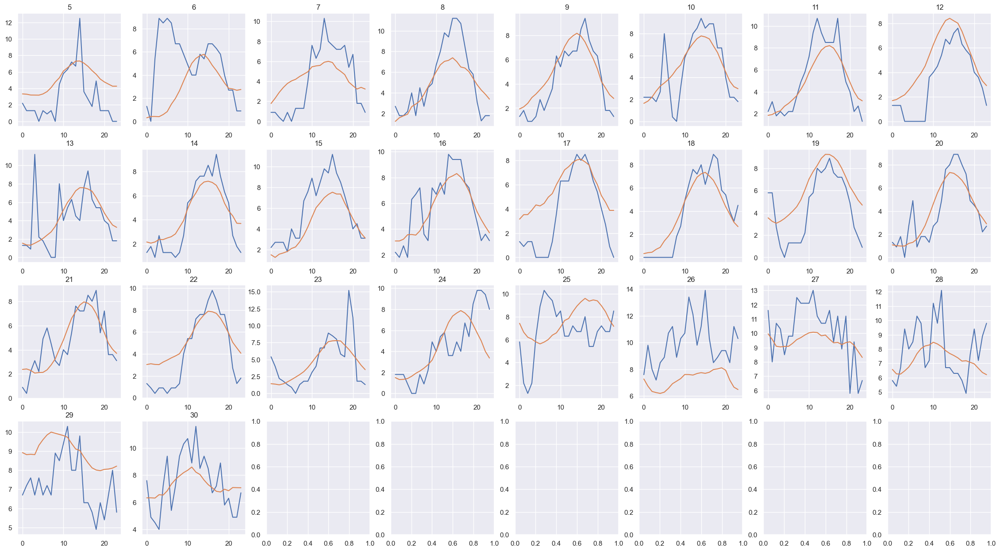

In [72]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[5]] # Junio
print(keys[5])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 6, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Julio

Julio


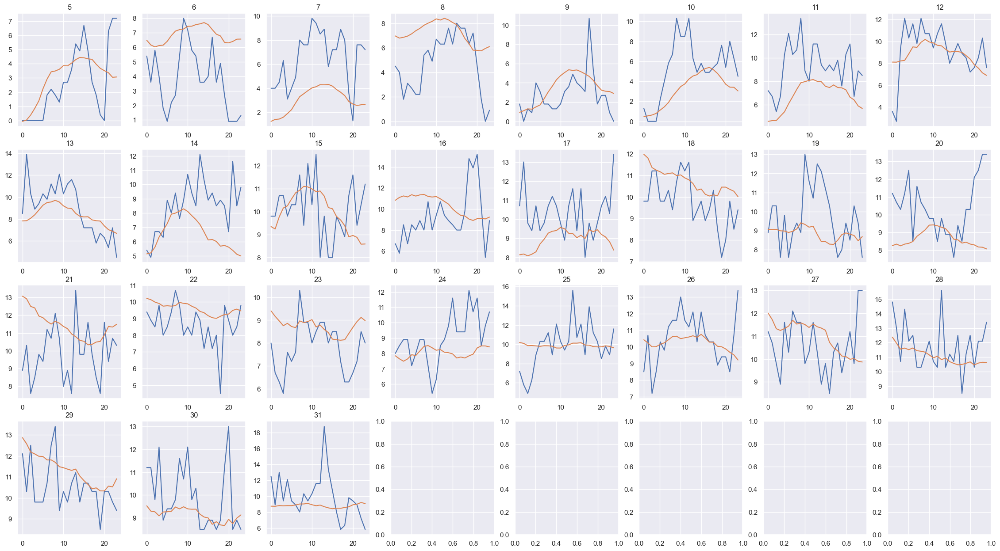

In [73]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[6]] # Julio
print(keys[6])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 7, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Agosto

Agosto


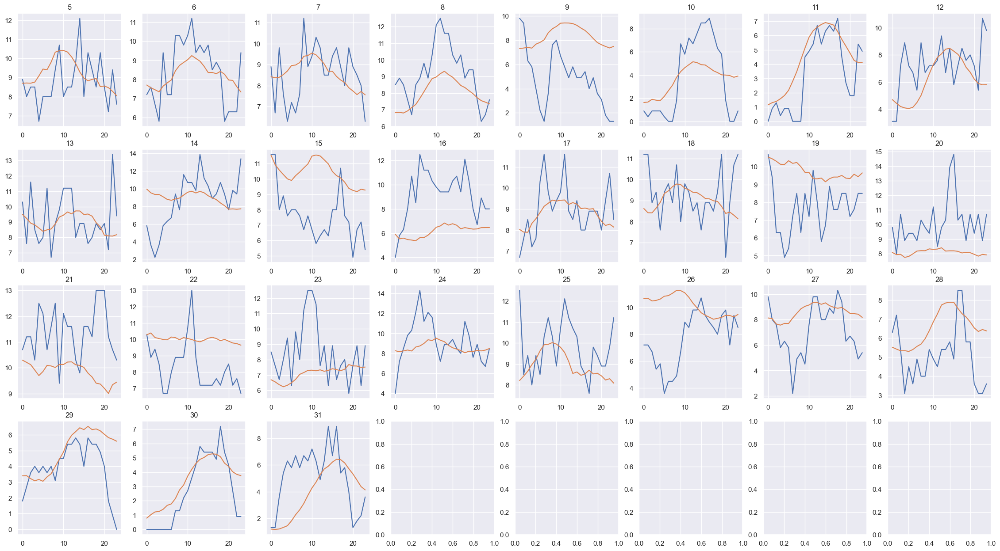

In [74]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[7]] # Julio
print(keys[7])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 8, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Septiembre

Septiembre


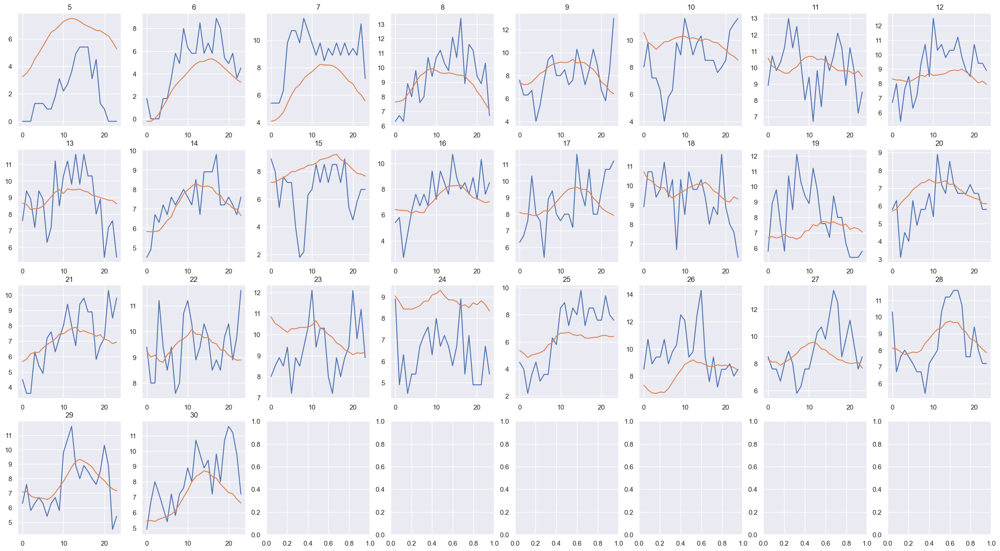

In [75]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[8]] # Julio
print(keys[8])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 9, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Octubre

Octubre


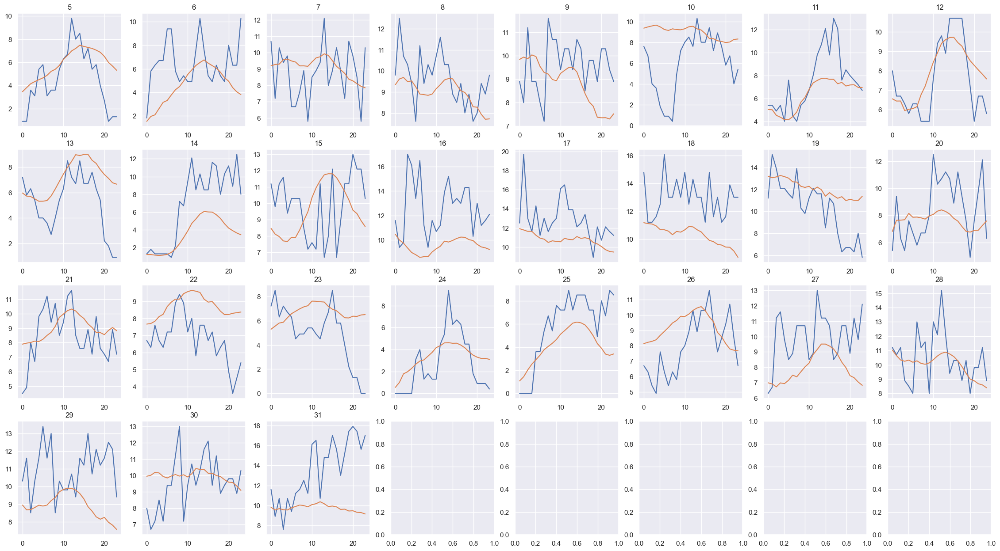

In [76]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[9]] # Julio
print(keys[9])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 10, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Noviembre

Novimebre


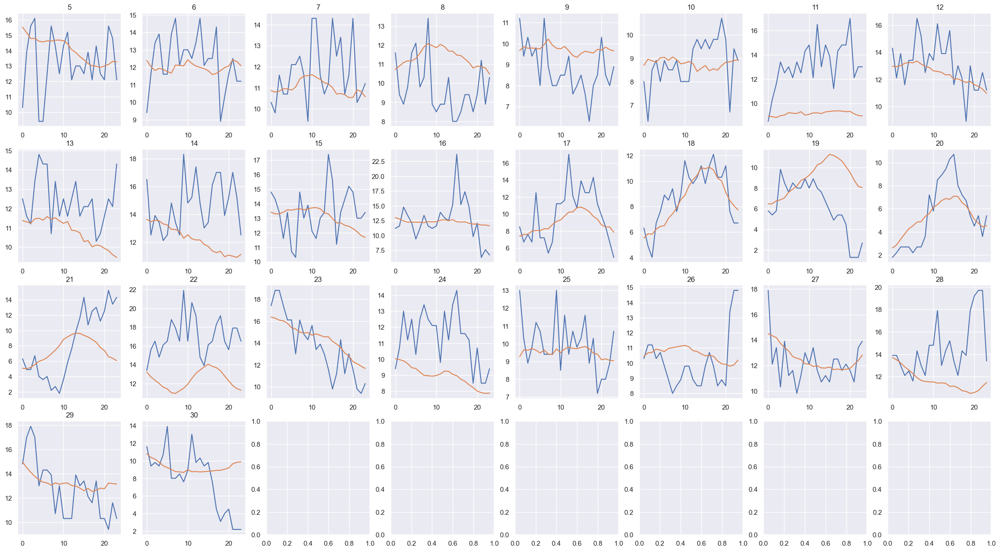

In [77]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[10]] # Noviembre
print(keys[10])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 11, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Diciembre

Diciembre


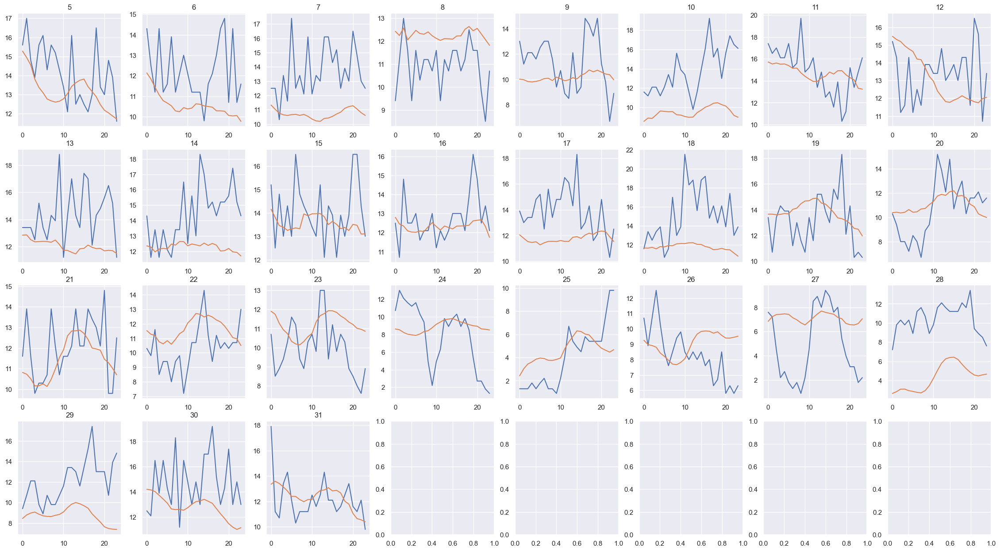

In [78]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[11]] # Diciembre
print(keys[11])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 12, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

In [17]:
### Exportacion del modelo de regresion

In [23]:
import warnings
warnings.filterwarnings('ignore')

combi = list_mimo[7]
print(combi)

# Regresion lineal
model = LinearRegression()
# Escalador
minmax_scl = MinMaxScaler()

# Preprocesamiento
df_ = df_Nizanda.copy()
drop_cols = [col for col in df_Nizanda.columns if col not in combi[0]]
df_.drop(drop_cols, axis = 1, inplace = True)

minmax_scl.fit(df_)

w, n_cols = data_preprocessing(df_, minmax_scl)
x_train, y_train = make_windows(w, input_size = combi[1], horizon = combi[2], shift = 0,  n_cols = n_cols)
        
if len(x_train.shape) > 2:
    # Convertir a arreglo de 2 dimensiones
    rows, nx, ny = x_train.shape
    x_train = x_train.reshape((rows, nx*ny))    

# Entrenamiento
model.fit(x_train, y_train)

# Exportacion
model_filename = 'model_LR.pkl'
pickle.dump(model, open(model_filename, 'wb'))

scaler_filename = 'scaler_LR.pkl'
pickle.dump(minmax_scl, open(scaler_filename, 'wb'))

(['High Wind Speed m/s'], 96, 24)


NameError: name 'df_Nizanda' is not defined

Febrero


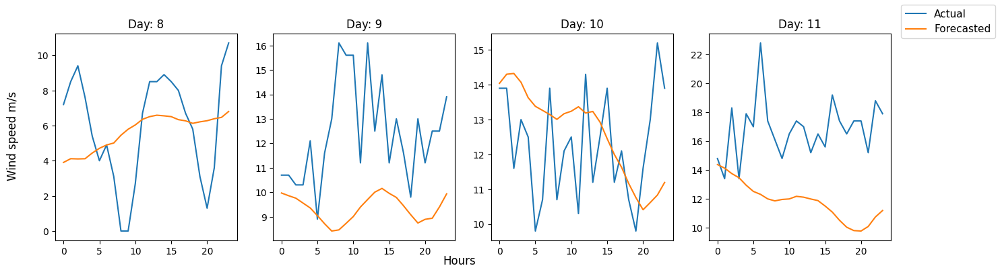

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [33]:
figure, axis = plt.subplots(1, 4, figsize=(16,4)) 
figure.supxlabel('Hours')
figure.supylabel('Wind speed m/s', x = .08)
fila = 0
columna = 0
dia = 8
df_mes = Meses[keys[1]] # Mayo
print(keys[1])

for i in range(8, 12):
    m, p, c, pred = simulation(combi, 2, i, model, minmax_scl)
    axis[fila].plot(c['High Wind Speed m/s'].values)
    axis[fila].plot(pred)
    axis[fila].set_title('Day: ' + str(i))
    fila += 1
    
figure.legend(labels=['Actual', 'Forecasted'], loc = 'upper right', prop={'size': 11})
plt.show()
figure.savefig(r'C:\Users\Angel-PC\Documents\Tesis\Notebooks\Resultados\LR_sim_febrero-2024.eps')

In [63]:
df_mes = Meses[keys[5]] # Mayo
print(keys[5])

m, p, c, pred = simulation(combi, 6, 8, model, minmax_scl)
    


Junio


In [64]:
pred

array([1.24738435, 1.59916136, 1.78148263, 1.94076446, 2.66666652,
       2.91585547, 3.21391729, 3.85375182, 4.57374064, 5.31534046,
       6.05125775, 6.70922733, 7.03969769, 7.13845517, 7.39047799,
       7.02691044, 6.49882994, 6.40097817, 6.0458567 , 5.40639301,
       4.77852816, 4.2737306 , 3.86821444, 3.39573845])